In [49]:
import tensorflow as tf
import pandas as pd
import numpy as np
import math
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import SimpleRNN
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import itertools
import random as python_random
from keras.initializers import GlorotUniform
from keras.initializers import Orthogonal
from keras.initializers import HeNormal
from keras.initializers import HeUniform


np.random.seed(42)
tf.random.set_seed(42)
python_random.seed(42)

In [50]:
def load_data(filepath):
    return pd.read_csv(filepath, parse_dates=['Date'])

In [51]:
def create_sequences(data, target, n_steps):
    X, y = [], []
    # print("data", data[:15])
    # print("target", target[:15])
    for i in range(len(data) - n_steps):
        X.append(data[i:(i + n_steps)])
        y.append(target[i + n_steps])
    return np.array(X), np.array(y)

In [52]:
def modify_data(data):
    result = None
    # print(data)

    # copy LMCADY_acu_5d_log into a new column ACU_5D and shift it by 5 days
    data['ACU_5D'] = data['LMCADY_acu_5d_log']
    data['ACU_5D'] = data['ACU_5D'].shift(5)

    data['ACU_4D'] = data['LMCADY'].rolling(window=4).sum()
    data['ACU_3D'] = data['LMCADY'].rolling(window=3).sum()
    data['ACU_2D'] = data['LMCADY'].rolling(window=2).sum()

    data.dropna(inplace=True)
    data.reset_index(drop=True, inplace=True)

    result = data
    # print(result.head(10))
    return result

In [53]:
def prepare_data(df, target_column, n_steps, feature_list = []):

    df = modify_data(df)
    df.to_csv('../output/modified_data.csv', index=False)

    features = df.drop(columns=[target_column, 'LMCADY_std_5d_log'])
    features = features.drop(columns = ['Date'])
    features = features[feature_list]
    print("Features utilizados:",features.columns)

    target = df[target_column]

    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    X, y = create_sequences(features_scaled, target, n_steps)
    # for i in range(15):
    #     print(X[i][0][0], y[i])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, shuffle = False)

    return X_train, X_test, y_train, y_test

In [54]:
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

In [55]:
def build_model(input_shape, md_prm: dict):
    model = Sequential()
    initializer = md_prm['initializer']
    # regularizer = L1L2(l1=0.0000025, l2=0.0000025)

    model.add(SimpleRNN(md_prm['lstm_units1'], return_sequences=True, input_shape=input_shape, kernel_initializer=initializer))#, kernel_regularizer=regularizer))    
    model.add(SimpleRNN(md_prm['lstm_units2'], kernel_initializer=initializer))#, kernel_regularizer=regularizer))
    
    model.add(Dense(1, kernel_initializer=initializer))

    model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[rmse])
    return model

In [56]:
def train_model(model, X_train, y_train, epochs, batch_size, verbose):

    early_stopping = EarlyStopping(
        monitor             ='val_loss',
        patience            =25,
        verbose             =1,
        restore_best_weights=True
    )

    history = model.fit(
        X_train, y_train,
        epochs              =epochs,
        batch_size          =batch_size,
        verbose             =verbose,
        callbacks           =[early_stopping],
        validation_split    =0.05
    )

    return history

In [57]:
def evaluate_model(model, X_test, y_test):
    return model.evaluate(X_test, y_test)

In [58]:
def plot_predictions(y_true, y_pred, n=-1, title="Prediction vs Actual Data", markersize=3, rmse=None):
    if n != -1:
        n = min(n, len(y_true), len(y_pred))

        y_true = y_true[-n:]
        y_pred = y_pred[-n:]

    plt.figure(figsize=(18, 2.5))
    plt.plot(y_true, label='Actual Values', marker='o', linestyle='-', markersize=markersize)

    # Plot the RMSE lines if rmse is provided
    if rmse is not None:
        plt.axhline(y= rmse, color='green', linestyle='--', linewidth=0.7)
        plt.axhline(y=-rmse, color='green', linestyle='--', linewidth=0.7)

        tot_pred = 0
        prof = 0
        loss = 0

        # plot green markers beyond the rmse range
        for i in range(len(y_pred)):
            if (y_pred[i] > rmse or y_pred[i] < - rmse):
                # print("{} {}".format(y_pred[i],y_true[i]))
                if (y_true[i] > 0 and y_pred[i] > 0) or (y_true[i] < 0 and y_pred[i] < 0):
                    plt.plot(i, y_pred[i], 'gx', markersize=markersize+1)
                    prof += 1
                else:
                    plt.plot(i, y_pred[i], 'rx', markersize=markersize+1)
                    loss += 1
                tot_pred += 1
            else:
                plt.plot(i, y_pred[i], marker='x', color='orange', markersize=markersize-1)

    else:
        plt.plot(y_true, label='Actual Values'   , marker='o', linestyle='-' , markersize=markersize)
        plt.plot(y_pred, label='Predicted Values', marker='x', linestyle='--', markersize=markersize)

    plt.axhline(y=0, color='gray', linestyle='--', linewidth=0.7)

    plt.title(title)
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

    return tot_pred, prof, loss

In [59]:
def trend_accuracy(y_true, y_pred):
    trend_up_true = 0
    trend_down_true = 0
    trend_up_pred = 0
    trend_down_pred = 0

    for j in range(len(y_true)-1):
        if y_true[j] > 0.0:
            trend_up_pred += 1
            if y_pred[j] > 0.0:
                trend_up_true += 1
        if y_true[j] < 0.0:
            trend_down_pred += 1
            if y_pred[j] < 0.0:
                trend_down_true += 1

    trend_true = trend_up_true + trend_down_true
    trend_pred = trend_up_pred + trend_down_pred

    trend_up_accuracy = trend_up_true/trend_up_pred
    trend_down_accuracy = trend_down_true/trend_down_pred
    trend_accuracy = trend_true/trend_pred

    return trend_accuracy, trend_up_accuracy, trend_down_accuracy

In [60]:
n_steps_options     = [40,60]
batch_size_options  = [256]
epochs_options      = [200]

lstm_units_options1 = [25,75,100]
lstm_units_options2 = [25,75,100]
initializer         = [ 
                        # GlorotUniform(seed=42)
                        # HeNormal(seed=42), 
                        # HeUniform(seed=42), 
                        Orthogonal(seed=42)
                        ]
activation_options  = ['relu']
dropout_options     = [.15]
num_layers_options  = [2]

# variable_options = ['LMCADS03','LMCADY','SPX','MXWD','XAU','XAG','ACU_5D','ACU_4D','ACU_3D','ACU_2D']
# modified_lists = [variable_options[:i] + variable_options[i+1:] for i in range(len(variable_options))]
# print(modified_lists)
modified_lists = [['LMCADS03','LMCADY','SPX','MXWD','XAG','XAU','ACU_5D','ACU_4D','ACU_3D','ACU_2D']]

# combinations
model_params_combinations = list(itertools.product(
    n_steps_options     ,
    lstm_units_options1,
    lstm_units_options2,
    initializer        ,
    activation_options,
    dropout_options,
    num_layers_options,
    batch_size_options,
    epochs_options,
    modified_lists
))
target_column = 'LMCADY_acu_5d_log'

In [61]:
n_iterations = len(model_params_combinations)
print("Total iterations: {}".format(n_iterations))

Total iterations: 18


In [62]:
def run_model_iterations():
    top_results = []
    i = 1
    for params in model_params_combinations:
        n_steps, lstm_units1, lstm_units2, initializer, activation, dropout, num_layers, batch_size, epochs, var_options = params
        try:

            # data load
            df = load_data("../input/copper_log_returns_5d_final.csv")
            print("\nIteration {}/{}".format(i, n_iterations))
            # print("Params: n_steps: {}, lstm_units1: {}, lstm_units2: {}, activation: {}, dropout: {}, num_layers: {}".format(
            #     n_steps, lstm_units1, lstm_units2, activation, dropout, num_layers)
            # )

            print("Train : batch    > {}".format(batch_size))
            print("        epochs   > {}".format(epochs))
            print("        n_steps  > {}".format(n_steps))
            
            # data preparation
            # print("Variables used: {}".format(var_options))
            X_train, X_test, y_train, y_test = prepare_data(df, target_column, n_steps, var_options)

            # build model
            model_params = {
                'lstm_units1'   : lstm_units1,
                'lstm_units2'   : lstm_units2,
                'activation'    : activation,
                'dropout'       : dropout,
                'num_layers'    : num_layers,
                'initializer'   : initializer
            }
            print("Model params: \n{}".format(model_params))

            input_shape = (X_train.shape[1], X_train.shape[2])
            print("Input shape: {}".format(input_shape))
            model = build_model(input_shape, model_params)
            print(model.summary())

            # model train
            if True:
                history = train_model(model, X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=2)

                # model evaluation
                y_pred      = model.predict(X_test)
                rmse_score  = math.sqrt(mean_squared_error(y_test, y_pred))
                std_dev     = np.std(y_test)

                print("Pred std dev: {:.6f}, test std dev: {:.6f}".format(np.std(y_pred), std_dev))

                if rmse_score < std_dev:
                    diff = rmse_score - std_dev + abs(np.std(y_pred) - std_dev)/4.0
                else:
                    diff = (rmse_score - std_dev) + abs(np.std(y_pred) - std_dev)/2.0

                # diff = (rmse_score - std_dev) + abs(np.std(y_pred) - std_dev)/2.0
                tren_acc, trend_up, trend_down = trend_accuracy(y_test, y_pred)
                result = {
                    'md_prm'    : model_params,
                    'n_steps'   : n_steps,
                    'batch_size': batch_size,
                    'epochs'    : epochs,
                    'rmse'      : rmse_score,
                    'std_dev'   : std_dev,
                    'diff'      : diff,
                    'predictions': y_pred,
                    'true_values': y_test,
                    'feature_list': var_options,
                    'tr_ac': tren_acc,
                    'tr_up': trend_up,
                    'tr_down': trend_down
                }

                # print("RMSE: {:.6f}, STD_DEV: {:.6f}, DIFF: {:.6f}".format(rmse_score, std_dev, diff))
                print("RMSE: {:.6f}, STD_DEV: {:.6f}, STD_PRD: {:.6f}, OBJDIFF: {:.6f}, RDIFF: {:.6f}".format(rmse_score, std_dev, np.std(y_pred), diff, (rmse_score - std_dev)))

                print("Trend: {:.2f}, Up: {:.2f}, Down: {:.2f}".format(tren_acc*100, trend_up*100, trend_down*100))

                top_results.append(result)
                top_results = sorted(top_results, key=lambda x: x['diff'])
                tot_pred, prof, loss = plot_predictions(result['true_values'], result['predictions'], -1, title="It. {}".format(i),rmse = rmse_score)
                print("Total TH Pred.: {}".format(tot_pred))
                if tot_pred != 0:
                    print("TH Pred. acc. : {:.2f}".format(prof*100.0/tot_pred))

            print("Completed Iteration {}/{}".format(i, n_iterations))
        except Exception as ex:
            print(f"An error occurred: {ex}. Skipping this combination.")
        i += 1
    return top_results


Iteration 1/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (40, 10)
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_42 (SimpleRNN)   (None, 40, 25)            900       
                                                                 
 simple_rnn_43 (SimpleRNN)   (None, 25)                1275      
                                                                 
 dense_6 (Dense)             (None, 1)                 26        
                                                            

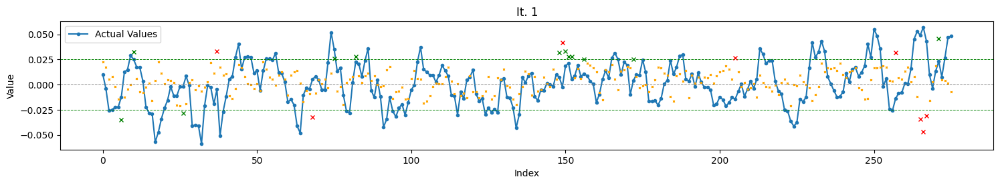

Total TH Pred.: 20
TH Pred. acc. : 60.00
Completed Iteration 1/18

Iteration 2/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (40, 10)
Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_44 (SimpleRNN)   (None, 40, 25)            900       
                                                                 
 simple_rnn_45 (SimpleRNN)   (None, 75)                7575      
                                                                 
 dense_7 (Dense)             (None, 1)                 76   

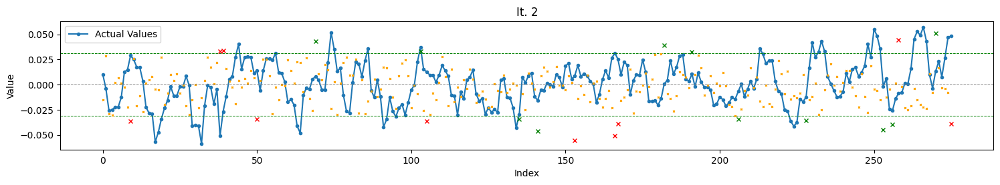

Total TH Pred.: 21
TH Pred. acc. : 52.38
Completed Iteration 2/18

Iteration 3/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (40, 10)
Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_46 (SimpleRNN)   (None, 40, 25)            900       
                                                                 
 simple_rnn_47 (SimpleRNN)   (None, 100)               12600     
                                                                 
 dense_8 (Dense)             (None, 1)                 101 

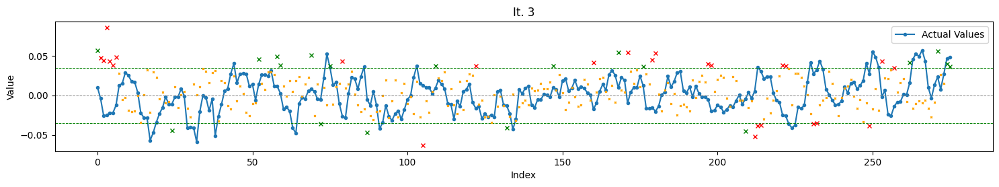

Total TH Pred.: 44
TH Pred. acc. : 43.18
Completed Iteration 3/18

Iteration 4/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (40, 10)
Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_48 (SimpleRNN)   (None, 40, 75)            6450      
                                                                 
 simple_rnn_49 (SimpleRNN)   (None, 25)                2525      
                                                                 
 dense_9 (Dense)             (None, 1)                 26   

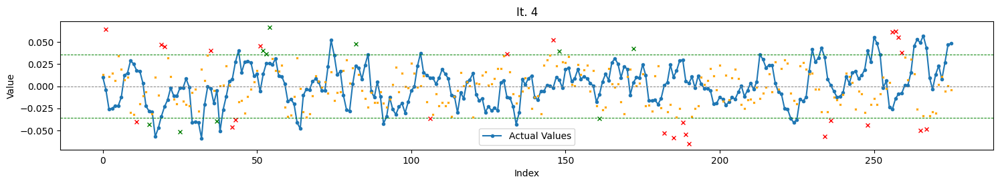

Total TH Pred.: 35
TH Pred. acc. : 28.57
Completed Iteration 4/18

Iteration 5/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (40, 10)
Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_50 (SimpleRNN)   (None, 40, 75)            6450      
                                                                 
 simple_rnn_51 (SimpleRNN)   (None, 75)                11325     
                                                                 
 dense_10 (Dense)            (None, 1)                 76   

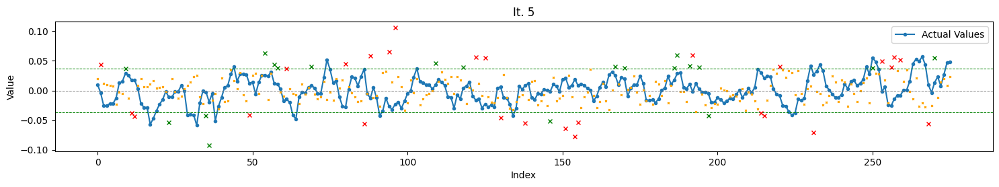

Total TH Pred.: 47
TH Pred. acc. : 42.55
Completed Iteration 5/18

Iteration 6/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (40, 10)
Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_52 (SimpleRNN)   (None, 40, 75)            6450      
                                                                 
 simple_rnn_53 (SimpleRNN)   (None, 100)               17600     
                                                                 
 dense_11 (Dense)            (None, 1)                 101 

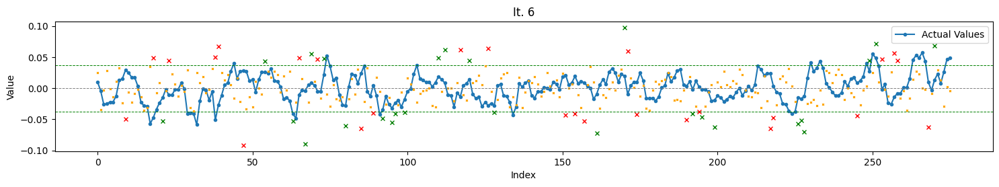

Total TH Pred.: 52
TH Pred. acc. : 50.00
Completed Iteration 6/18

Iteration 7/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (40, 10)
Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_54 (SimpleRNN)   (None, 40, 100)           11100     
                                                                 
 simple_rnn_55 (SimpleRNN)   (None, 25)                3150      
                                                                 
 dense_12 (Dense)            (None, 1)                 26  

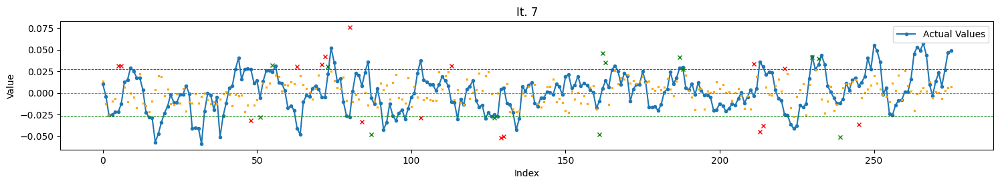

Total TH Pred.: 30
TH Pred. acc. : 43.33
Completed Iteration 7/18

Iteration 8/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (40, 10)
Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_56 (SimpleRNN)   (None, 40, 100)           11100     
                                                                 
 simple_rnn_57 (SimpleRNN)   (None, 75)                13200     
                                                                 
 dense_13 (Dense)            (None, 1)                 76  

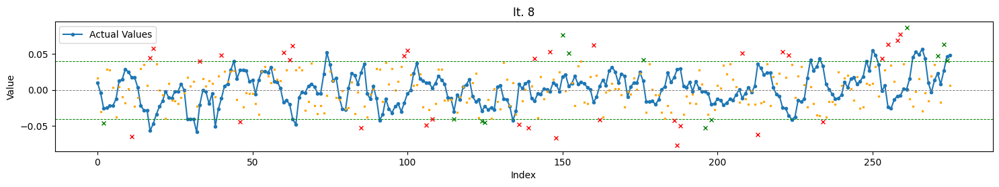

Total TH Pred.: 46
TH Pred. acc. : 28.26
Completed Iteration 8/18

Iteration 9/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (40, 10)
Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_58 (SimpleRNN)   (None, 40, 100)           11100     
                                                                 
 simple_rnn_59 (SimpleRNN)   (None, 100)               20100     
                                                                 
 dense_14 (Dense)            (None, 1)                 101

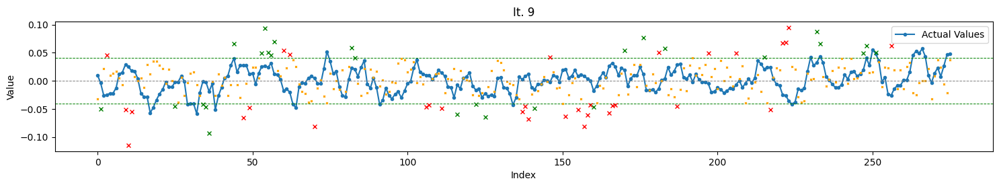

Total TH Pred.: 60
TH Pred. acc. : 45.00
Completed Iteration 9/18

Iteration 10/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (60, 10)
Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_60 (SimpleRNN)   (None, 60, 25)            900       
                                                                 
 simple_rnn_61 (SimpleRNN)   (None, 25)                1275      
                                                                 
 dense_15 (Dense)            (None, 1)                 26  

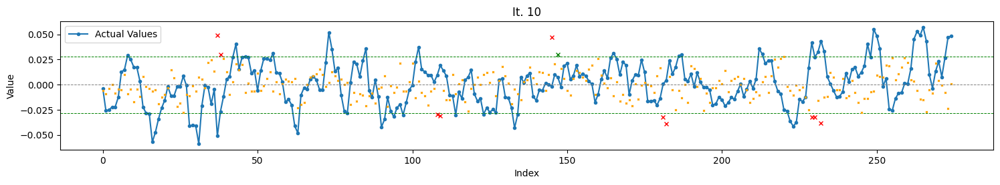

Total TH Pred.: 11
TH Pred. acc. : 9.09
Completed Iteration 10/18

Iteration 11/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (60, 10)
Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_62 (SimpleRNN)   (None, 60, 25)            900       
                                                                 
 simple_rnn_63 (SimpleRNN)   (None, 75)                7575      
                                                                 
 dense_16 (Dense)            (None, 1)                 76  

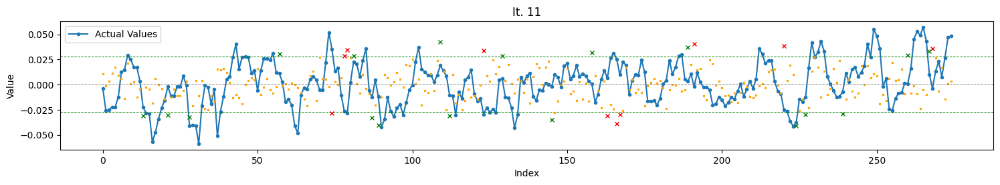

Total TH Pred.: 28
TH Pred. acc. : 64.29
Completed Iteration 11/18

Iteration 12/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (60, 10)
Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_64 (SimpleRNN)   (None, 60, 25)            900       
                                                                 
 simple_rnn_65 (SimpleRNN)   (None, 100)               12600     
                                                                 
 dense_17 (Dense)            (None, 1)                 10

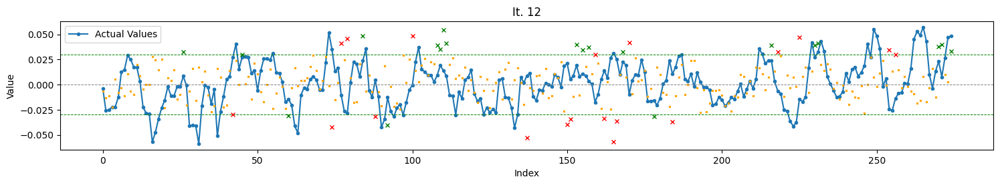

Total TH Pred.: 39
TH Pred. acc. : 51.28
Completed Iteration 12/18

Iteration 13/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (60, 10)
Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_66 (SimpleRNN)   (None, 60, 75)            6450      
                                                                 
 simple_rnn_67 (SimpleRNN)   (None, 25)                2525      
                                                                 
 dense_18 (Dense)            (None, 1)                 26 

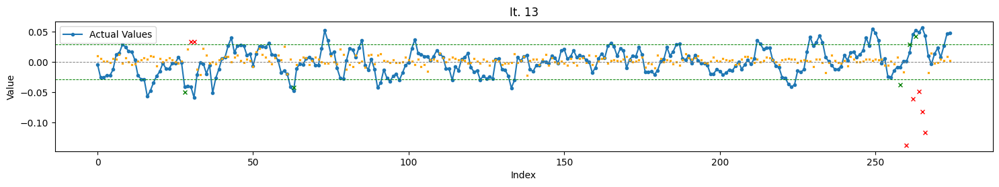

Total TH Pred.: 12
TH Pred. acc. : 41.67
Completed Iteration 13/18

Iteration 14/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (60, 10)
Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_68 (SimpleRNN)   (None, 60, 75)            6450      
                                                                 
 simple_rnn_69 (SimpleRNN)   (None, 75)                11325     
                                                                 
 dense_19 (Dense)            (None, 1)                 76 

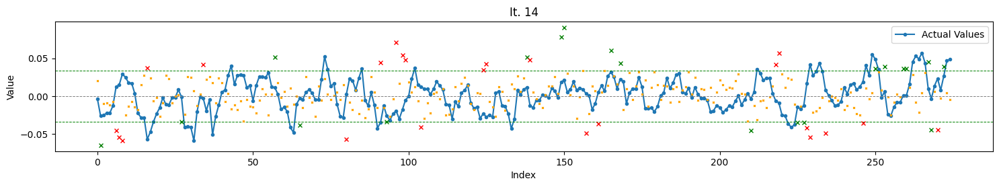

Total TH Pred.: 43
TH Pred. acc. : 46.51
Completed Iteration 14/18

Iteration 15/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (60, 10)
Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_70 (SimpleRNN)   (None, 60, 75)            6450      
                                                                 
 simple_rnn_71 (SimpleRNN)   (None, 100)               17600     
                                                                 
 dense_20 (Dense)            (None, 1)                 10

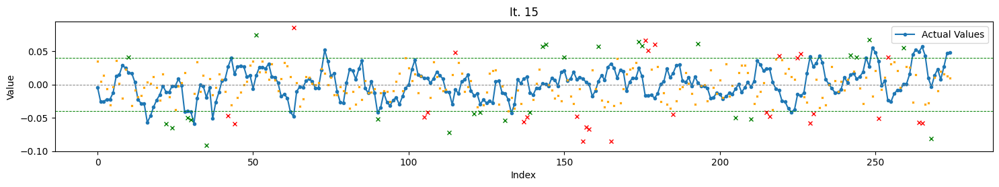

Total TH Pred.: 55
TH Pred. acc. : 49.09
Completed Iteration 15/18

Iteration 16/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (60, 10)
Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_72 (SimpleRNN)   (None, 60, 100)           11100     
                                                                 
 simple_rnn_73 (SimpleRNN)   (None, 25)                3150      
                                                                 
 dense_21 (Dense)            (None, 1)                 26

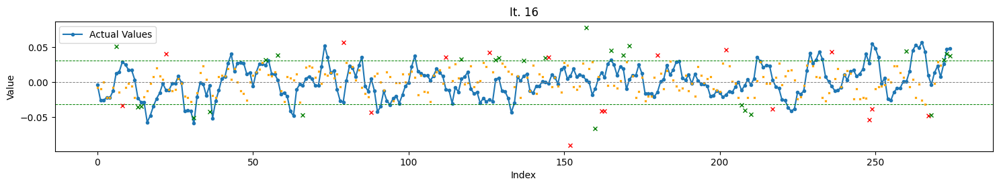

Total TH Pred.: 43
TH Pred. acc. : 60.47
Completed Iteration 16/18

Iteration 17/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (60, 10)
Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_74 (SimpleRNN)   (None, 60, 100)           11100     
                                                                 
 simple_rnn_75 (SimpleRNN)   (None, 75)                13200     
                                                                 
 dense_22 (Dense)            (None, 1)                 76

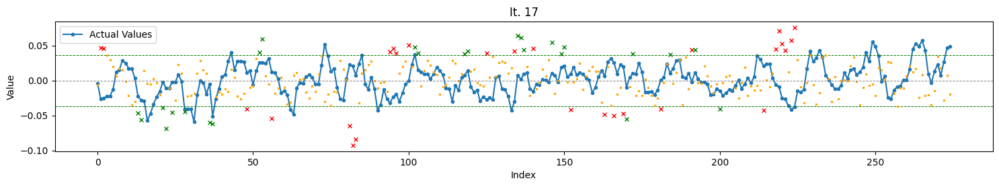

Total TH Pred.: 52
TH Pred. acc. : 48.08
Completed Iteration 17/18

Iteration 18/18
Train : batch    > 256
        epochs   > 200
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Input shape: (60, 10)
Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_76 (SimpleRNN)   (None, 60, 100)           11100     
                                                                 
 simple_rnn_77 (SimpleRNN)   (None, 100)               20100     
                                                                 
 dense_23 (Dense)            (None, 1)                 1

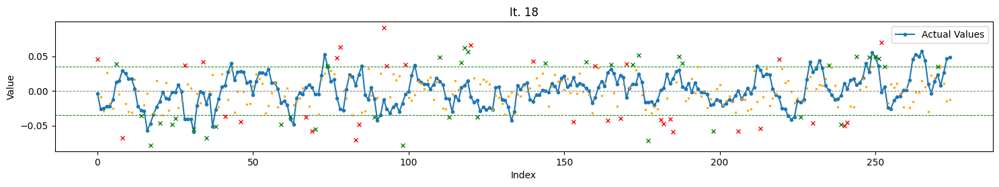

Total TH Pred.: 72
TH Pred. acc. : 54.17
Completed Iteration 18/18


In [63]:
top_results = run_model_iterations()

In [64]:
top_results_sort = sorted(top_results, key=lambda x: x['diff'])[:15]

Top 1 - 0.5
RMSE: 0.025128, STD_DEV: 0.021968, STD_PRD: 0.013265, OBJDIFF: 0.007511, RDIFF: 0.003160
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026049, inv. diff> 0.008433
Trend accuracy       : 52.727
Trend up accuracy    : 65.068
Trend down accuracy  : 38.760


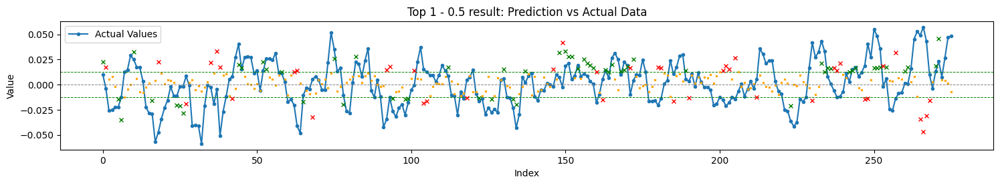

Total TH Pred.: 102
TH Pred. acc. : 58.82


Top 2 - 0.5
RMSE: 0.027260, STD_DEV: 0.021968, STD_PRD: 0.017434, OBJDIFF: 0.007559, RDIFF: 0.005292
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028125, inv. diff> 0.008423
Trend accuracy       : 54.545
Trend up accuracy    : 58.219
Trend down accuracy  : 50.388


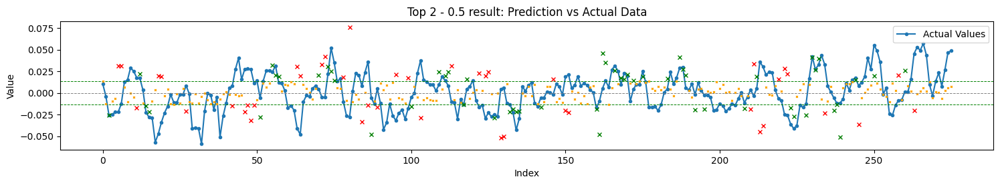

Total TH Pred.: 98
TH Pred. acc. : 56.12


Top 3 - 0.5
RMSE: 0.029646, STD_DEV: 0.022002, STD_PRD: 0.019800, OBJDIFF: 0.008745, RDIFF: 0.007645
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029856, inv. diff> 0.008955
Trend accuracy       : 52.555
Trend up accuracy    : 55.862
Trend down accuracy  : 48.837


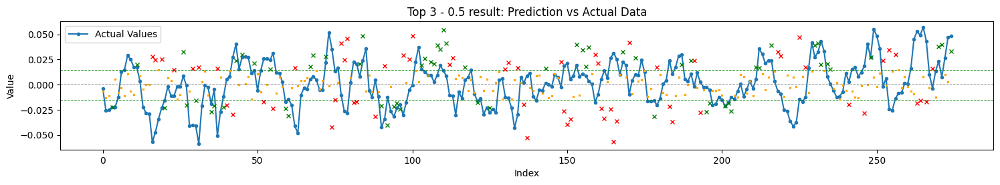

Total TH Pred.: 124
TH Pred. acc. : 50.81


Top 4 - 0.5
RMSE: 0.027890, STD_DEV: 0.022002, STD_PRD: 0.016155, OBJDIFF: 0.008812, RDIFF: 0.005889
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027303, inv. diff> 0.008224
Trend accuracy       : 46.715
Trend up accuracy    : 44.828
Trend down accuracy  : 48.837


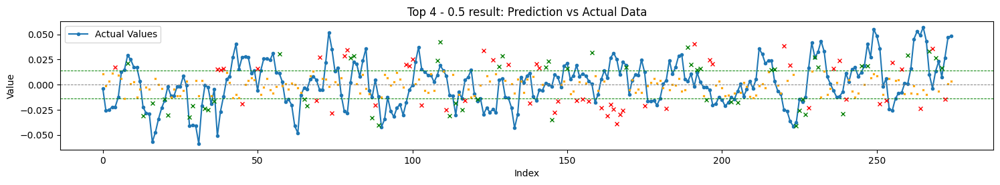

Total TH Pred.: 107
TH Pred. acc. : 49.53


Top 5 - 0.5
RMSE: 0.031104, STD_DEV: 0.022002, STD_PRD: 0.022781, OBJDIFF: 0.009492, RDIFF: 0.009103
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.031811, inv. diff> 0.010199
Trend accuracy       : 50.000
Trend up accuracy    : 54.483
Trend down accuracy  : 44.961


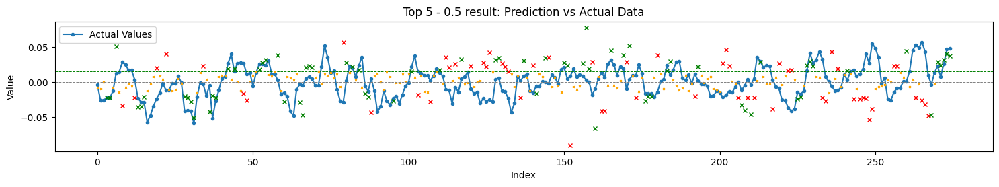

Total TH Pred.: 129
TH Pred. acc. : 55.04


Top 6 - 0.5
RMSE: 0.028839, STD_DEV: 0.022002, STD_PRD: 0.015904, OBJDIFF: 0.009886, RDIFF: 0.006837
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027215, inv. diff> 0.008263
Trend accuracy       : 52.190
Trend up accuracy    : 67.586
Trend down accuracy  : 34.884


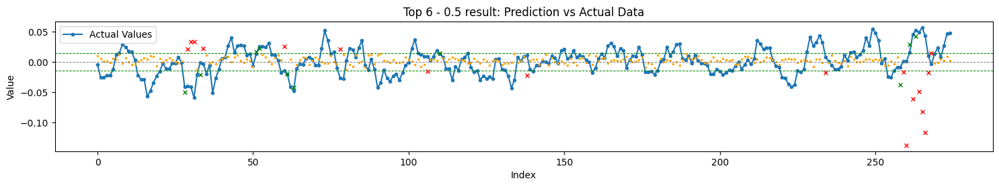

Total TH Pred.: 27
TH Pred. acc. : 37.04


Top 7 - 0.5
RMSE: 0.028256, STD_DEV: 0.022002, STD_PRD: 0.013949, OBJDIFF: 0.010281, RDIFF: 0.006255
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026051, inv. diff> 0.008075
Trend accuracy       : 44.891
Trend up accuracy    : 41.379
Trend down accuracy  : 48.837


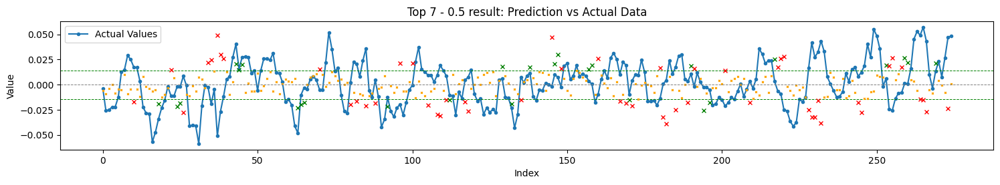

Total TH Pred.: 80
TH Pred. acc. : 33.75


Top 8 - 0.5
RMSE: 0.030987, STD_DEV: 0.021968, STD_PRD: 0.018166, OBJDIFF: 0.010920, RDIFF: 0.009018
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028559, inv. diff> 0.008492
Trend accuracy       : 43.273
Trend up accuracy    : 36.986
Trend down accuracy  : 50.388


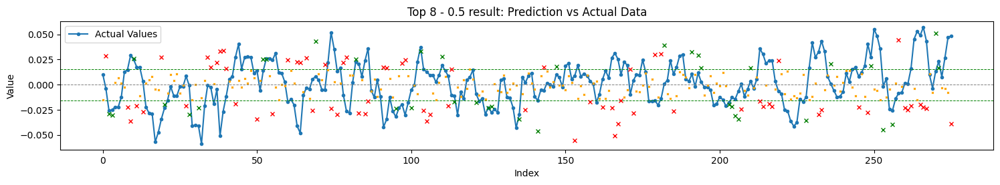

Total TH Pred.: 107
TH Pred. acc. : 34.58


Top 9 - 0.5
RMSE: 0.033816, STD_DEV: 0.022002, STD_PRD: 0.024176, OBJDIFF: 0.012902, RDIFF: 0.011815
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032828, inv. diff> 0.011914
Trend accuracy       : 47.810
Trend up accuracy    : 50.345
Trend down accuracy  : 44.961


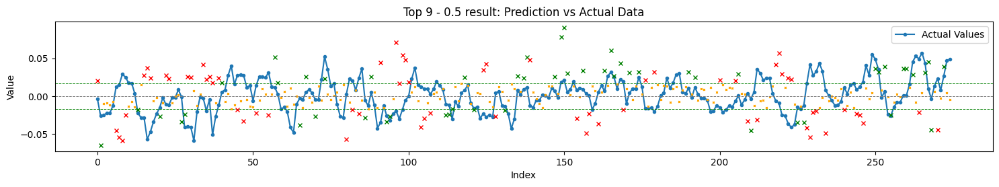

Total TH Pred.: 117
TH Pred. acc. : 45.30


Top 10 - 0.5
RMSE: 0.034754, STD_DEV: 0.021968, STD_PRD: 0.023858, OBJDIFF: 0.013730, RDIFF: 0.012786
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032922, inv. diff> 0.011898
Trend accuracy       : 41.455
Trend up accuracy    : 46.575
Trend down accuracy  : 35.659


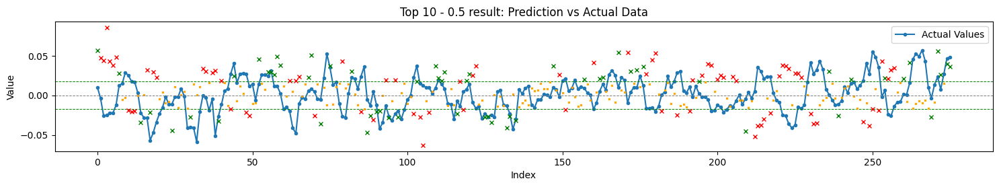

Total TH Pred.: 139
TH Pred. acc. : 43.17


Top 11 - 0.5
RMSE: 0.035847, STD_DEV: 0.021968, STD_PRD: 0.024534, OBJDIFF: 0.015162, RDIFF: 0.013879
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032940, inv. diff> 0.012254
Trend accuracy       : 44.727
Trend up accuracy    : 42.466
Trend down accuracy  : 47.287


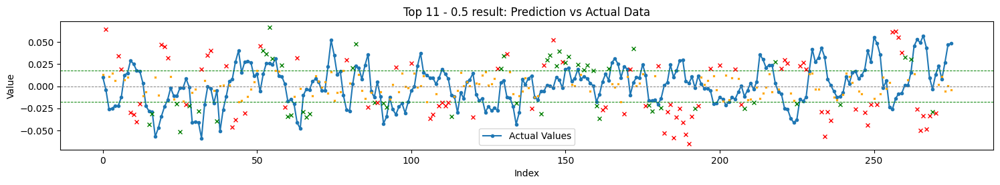

Total TH Pred.: 138
TH Pred. acc. : 38.41


Top 12 - 0.5
RMSE: 0.036490, STD_DEV: 0.021968, STD_PRD: 0.027188, OBJDIFF: 0.017131, RDIFF: 0.014522
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035034, inv. diff> 0.015675
Trend accuracy       : 43.636
Trend up accuracy    : 41.781
Trend down accuracy  : 45.736


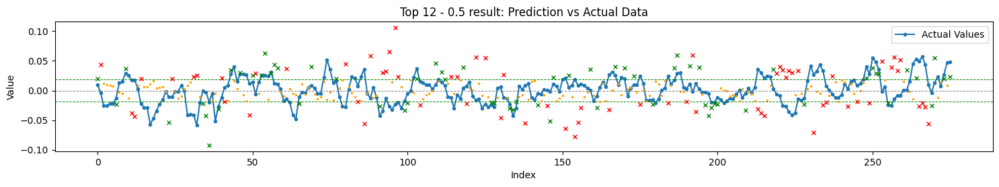

Total TH Pred.: 132
TH Pred. acc. : 49.24


Top 13 - 0.5
RMSE: 0.035285, STD_DEV: 0.022002, STD_PRD: 0.030008, OBJDIFF: 0.017287, RDIFF: 0.013284
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.037241, inv. diff> 0.019243
Trend accuracy       : 54.015
Trend up accuracy    : 48.966
Trend down accuracy  : 59.690


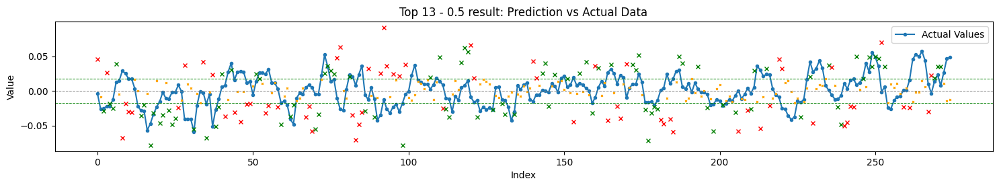

Total TH Pred.: 155
TH Pred. acc. : 57.42


Top 14 - 0.5
RMSE: 0.036799, STD_DEV: 0.022002, STD_PRD: 0.028081, OBJDIFF: 0.017837, RDIFF: 0.014798
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035727, inv. diff> 0.016765
Trend accuracy       : 48.175
Trend up accuracy    : 47.586
Trend down accuracy  : 48.837


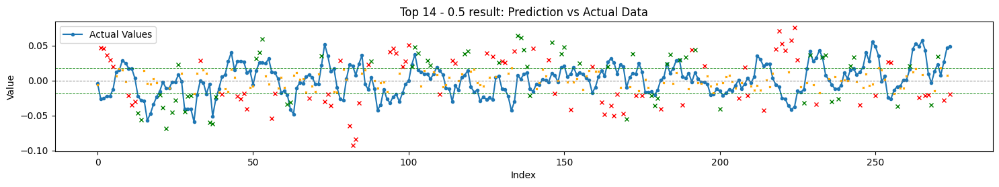

Total TH Pred.: 140
TH Pred. acc. : 44.29


Top 15 - 0.5
RMSE: 0.037216, STD_DEV: 0.021968, STD_PRD: 0.029667, OBJDIFF: 0.019096, RDIFF: 0.015247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.036920, inv. diff> 0.018801
Trend accuracy       : 45.091
Trend up accuracy    : 42.466
Trend down accuracy  : 48.062


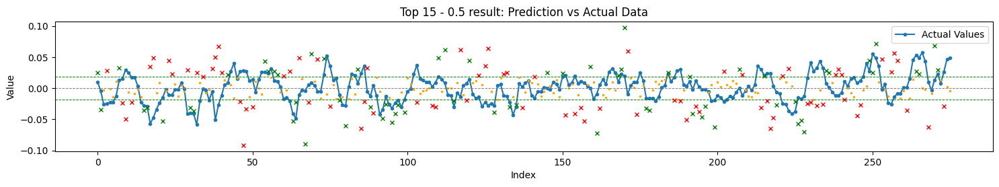

Total TH Pred.: 144
TH Pred. acc. : 45.83


Top 1 - 0.6
RMSE: 0.025128, STD_DEV: 0.021968, STD_PRD: 0.013265, OBJDIFF: 0.007511, RDIFF: 0.003160
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026049, inv. diff> 0.008433
Trend accuracy       : 52.727
Trend up accuracy    : 65.068
Trend down accuracy  : 38.760


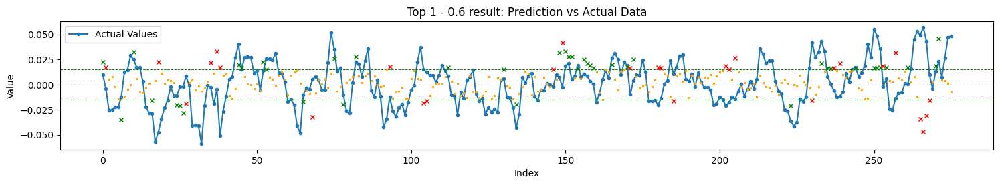

Total TH Pred.: 70
TH Pred. acc. : 60.00


Top 2 - 0.6
RMSE: 0.027260, STD_DEV: 0.021968, STD_PRD: 0.017434, OBJDIFF: 0.007559, RDIFF: 0.005292
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028125, inv. diff> 0.008423
Trend accuracy       : 54.545
Trend up accuracy    : 58.219
Trend down accuracy  : 50.388


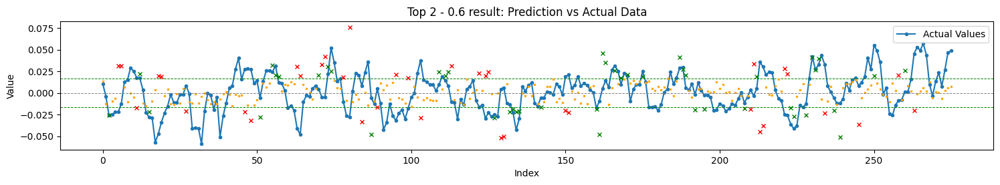

Total TH Pred.: 82
TH Pred. acc. : 54.88


Top 3 - 0.6
RMSE: 0.029646, STD_DEV: 0.022002, STD_PRD: 0.019800, OBJDIFF: 0.008745, RDIFF: 0.007645
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029856, inv. diff> 0.008955
Trend accuracy       : 52.555
Trend up accuracy    : 55.862
Trend down accuracy  : 48.837


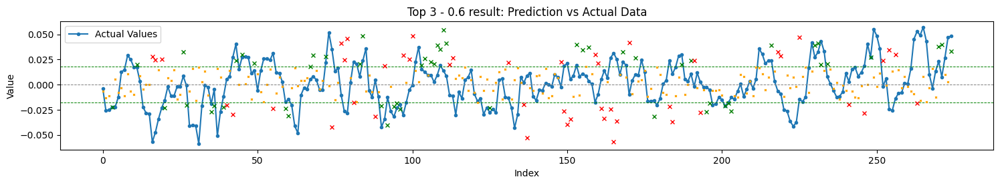

Total TH Pred.: 100
TH Pred. acc. : 54.00


Top 4 - 0.6
RMSE: 0.027890, STD_DEV: 0.022002, STD_PRD: 0.016155, OBJDIFF: 0.008812, RDIFF: 0.005889
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027303, inv. diff> 0.008224
Trend accuracy       : 46.715
Trend up accuracy    : 44.828
Trend down accuracy  : 48.837


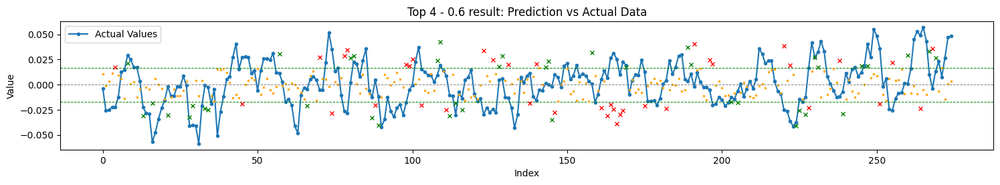

Total TH Pred.: 79
TH Pred. acc. : 51.90


Top 5 - 0.6
RMSE: 0.031104, STD_DEV: 0.022002, STD_PRD: 0.022781, OBJDIFF: 0.009492, RDIFF: 0.009103
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.031811, inv. diff> 0.010199
Trend accuracy       : 50.000
Trend up accuracy    : 54.483
Trend down accuracy  : 44.961


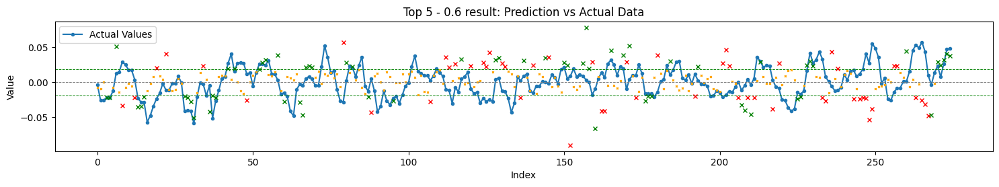

Total TH Pred.: 117
TH Pred. acc. : 54.70


Top 6 - 0.6
RMSE: 0.028839, STD_DEV: 0.022002, STD_PRD: 0.015904, OBJDIFF: 0.009886, RDIFF: 0.006837
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027215, inv. diff> 0.008263
Trend accuracy       : 52.190
Trend up accuracy    : 67.586
Trend down accuracy  : 34.884


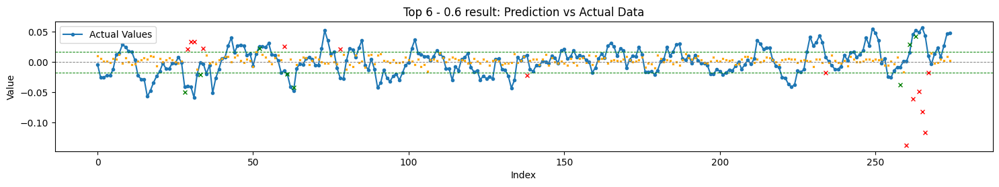

Total TH Pred.: 22
TH Pred. acc. : 36.36


Top 7 - 0.6
RMSE: 0.028256, STD_DEV: 0.022002, STD_PRD: 0.013949, OBJDIFF: 0.010281, RDIFF: 0.006255
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026051, inv. diff> 0.008075
Trend accuracy       : 44.891
Trend up accuracy    : 41.379
Trend down accuracy  : 48.837


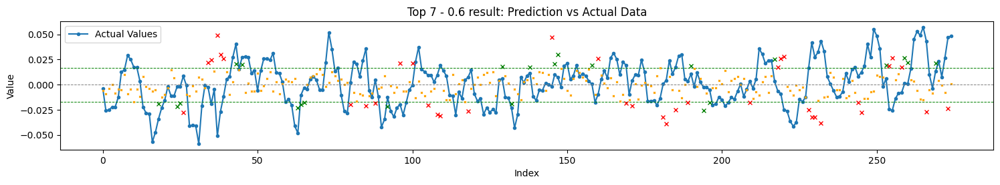

Total TH Pred.: 61
TH Pred. acc. : 37.70


Top 8 - 0.6
RMSE: 0.030987, STD_DEV: 0.021968, STD_PRD: 0.018166, OBJDIFF: 0.010920, RDIFF: 0.009018
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028559, inv. diff> 0.008492
Trend accuracy       : 43.273
Trend up accuracy    : 36.986
Trend down accuracy  : 50.388


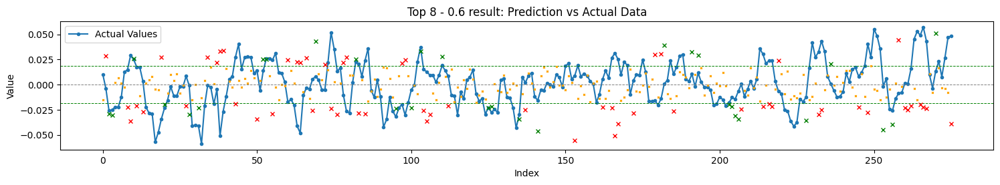

Total TH Pred.: 89
TH Pred. acc. : 33.71


Top 9 - 0.6
RMSE: 0.033816, STD_DEV: 0.022002, STD_PRD: 0.024176, OBJDIFF: 0.012902, RDIFF: 0.011815
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032828, inv. diff> 0.011914
Trend accuracy       : 47.810
Trend up accuracy    : 50.345
Trend down accuracy  : 44.961


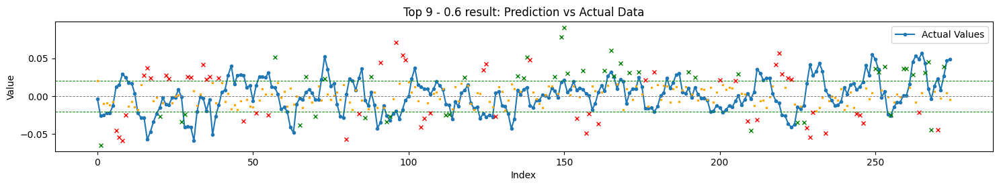

Total TH Pred.: 102
TH Pred. acc. : 46.08


Top 10 - 0.6
RMSE: 0.034754, STD_DEV: 0.021968, STD_PRD: 0.023858, OBJDIFF: 0.013730, RDIFF: 0.012786
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032922, inv. diff> 0.011898
Trend accuracy       : 41.455
Trend up accuracy    : 46.575
Trend down accuracy  : 35.659


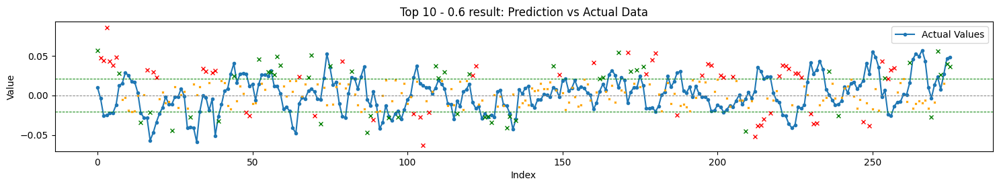

Total TH Pred.: 110
TH Pred. acc. : 46.36


Top 11 - 0.6
RMSE: 0.035847, STD_DEV: 0.021968, STD_PRD: 0.024534, OBJDIFF: 0.015162, RDIFF: 0.013879
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032940, inv. diff> 0.012254
Trend accuracy       : 44.727
Trend up accuracy    : 42.466
Trend down accuracy  : 47.287


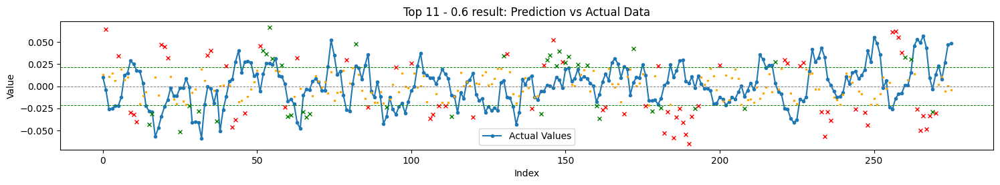

Total TH Pred.: 108
TH Pred. acc. : 37.04


Top 12 - 0.6
RMSE: 0.036490, STD_DEV: 0.021968, STD_PRD: 0.027188, OBJDIFF: 0.017131, RDIFF: 0.014522
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035034, inv. diff> 0.015675
Trend accuracy       : 43.636
Trend up accuracy    : 41.781
Trend down accuracy  : 45.736


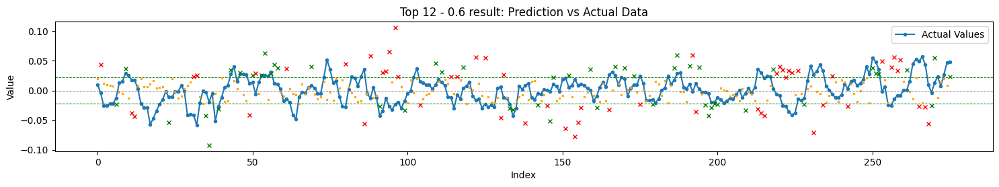

Total TH Pred.: 106
TH Pred. acc. : 48.11


Top 13 - 0.6
RMSE: 0.035285, STD_DEV: 0.022002, STD_PRD: 0.030008, OBJDIFF: 0.017287, RDIFF: 0.013284
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.037241, inv. diff> 0.019243
Trend accuracy       : 54.015
Trend up accuracy    : 48.966
Trend down accuracy  : 59.690


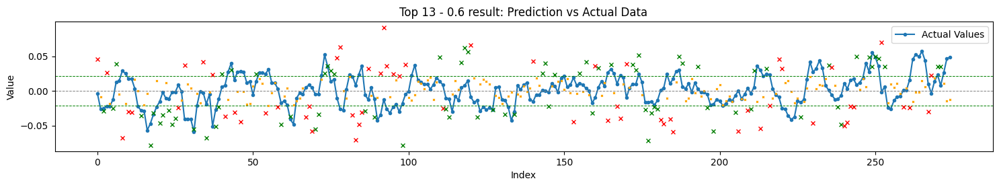

Total TH Pred.: 137
TH Pred. acc. : 56.20


Top 14 - 0.6
RMSE: 0.036799, STD_DEV: 0.022002, STD_PRD: 0.028081, OBJDIFF: 0.017837, RDIFF: 0.014798
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035727, inv. diff> 0.016765
Trend accuracy       : 48.175
Trend up accuracy    : 47.586
Trend down accuracy  : 48.837


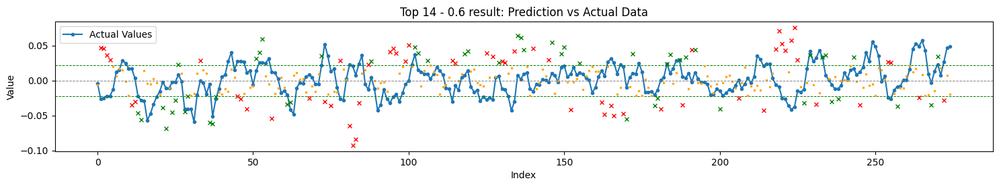

Total TH Pred.: 110
TH Pred. acc. : 47.27


Top 15 - 0.6
RMSE: 0.037216, STD_DEV: 0.021968, STD_PRD: 0.029667, OBJDIFF: 0.019096, RDIFF: 0.015247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.036920, inv. diff> 0.018801
Trend accuracy       : 45.091
Trend up accuracy    : 42.466
Trend down accuracy  : 48.062


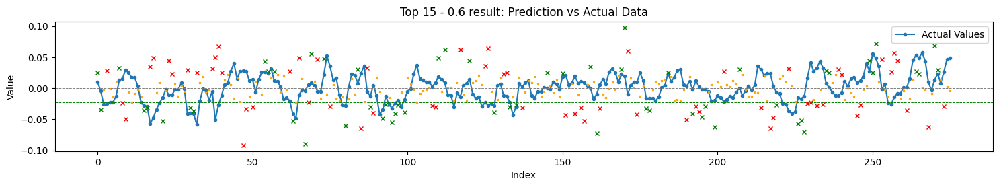

Total TH Pred.: 119
TH Pred. acc. : 47.90


Top 1 - 0.7
RMSE: 0.025128, STD_DEV: 0.021968, STD_PRD: 0.013265, OBJDIFF: 0.007511, RDIFF: 0.003160
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026049, inv. diff> 0.008433
Trend accuracy       : 52.727
Trend up accuracy    : 65.068
Trend down accuracy  : 38.760


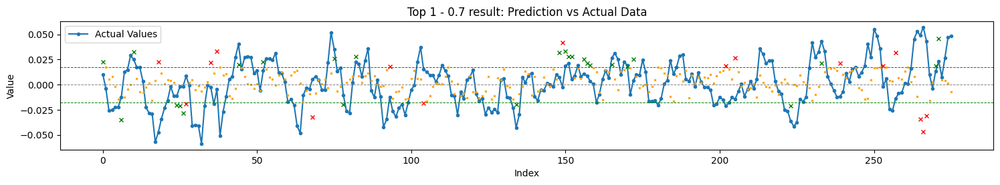

Total TH Pred.: 42
TH Pred. acc. : 61.90


Top 2 - 0.7
RMSE: 0.027260, STD_DEV: 0.021968, STD_PRD: 0.017434, OBJDIFF: 0.007559, RDIFF: 0.005292
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028125, inv. diff> 0.008423
Trend accuracy       : 54.545
Trend up accuracy    : 58.219
Trend down accuracy  : 50.388


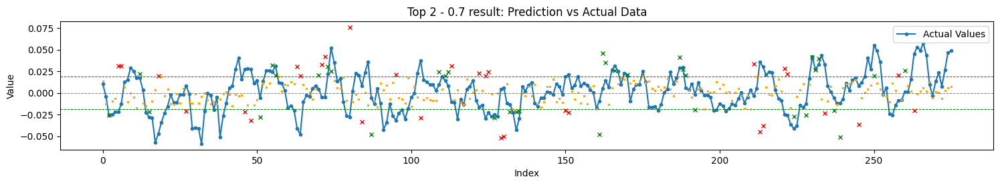

Total TH Pred.: 66
TH Pred. acc. : 53.03


Top 3 - 0.7
RMSE: 0.029646, STD_DEV: 0.022002, STD_PRD: 0.019800, OBJDIFF: 0.008745, RDIFF: 0.007645
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029856, inv. diff> 0.008955
Trend accuracy       : 52.555
Trend up accuracy    : 55.862
Trend down accuracy  : 48.837


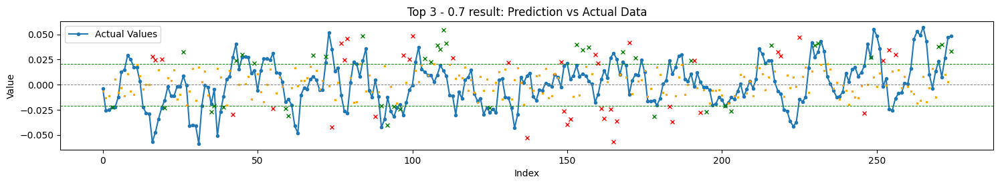

Total TH Pred.: 81
TH Pred. acc. : 51.85


Top 4 - 0.7
RMSE: 0.027890, STD_DEV: 0.022002, STD_PRD: 0.016155, OBJDIFF: 0.008812, RDIFF: 0.005889
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027303, inv. diff> 0.008224
Trend accuracy       : 46.715
Trend up accuracy    : 44.828
Trend down accuracy  : 48.837


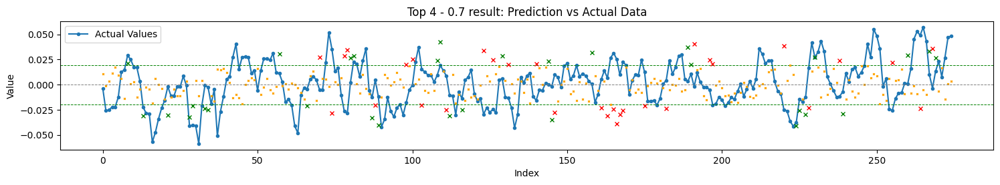

Total TH Pred.: 62
TH Pred. acc. : 50.00


Top 5 - 0.7
RMSE: 0.031104, STD_DEV: 0.022002, STD_PRD: 0.022781, OBJDIFF: 0.009492, RDIFF: 0.009103
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.031811, inv. diff> 0.010199
Trend accuracy       : 50.000
Trend up accuracy    : 54.483
Trend down accuracy  : 44.961


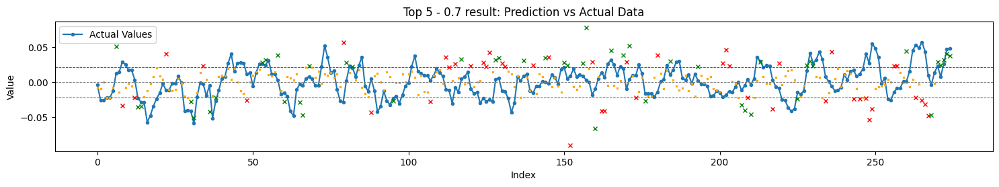

Total TH Pred.: 93
TH Pred. acc. : 51.61


Top 6 - 0.7
RMSE: 0.028839, STD_DEV: 0.022002, STD_PRD: 0.015904, OBJDIFF: 0.009886, RDIFF: 0.006837
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027215, inv. diff> 0.008263
Trend accuracy       : 52.190
Trend up accuracy    : 67.586
Trend down accuracy  : 34.884


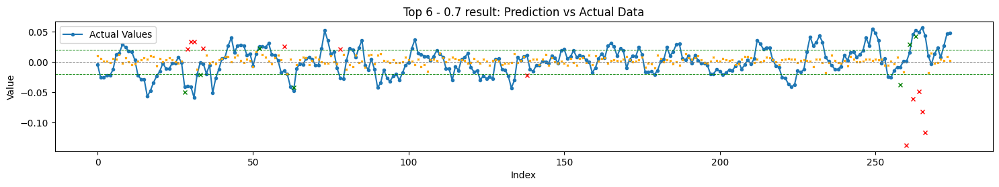

Total TH Pred.: 19
TH Pred. acc. : 36.84


Top 7 - 0.7
RMSE: 0.028256, STD_DEV: 0.022002, STD_PRD: 0.013949, OBJDIFF: 0.010281, RDIFF: 0.006255
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026051, inv. diff> 0.008075
Trend accuracy       : 44.891
Trend up accuracy    : 41.379
Trend down accuracy  : 48.837


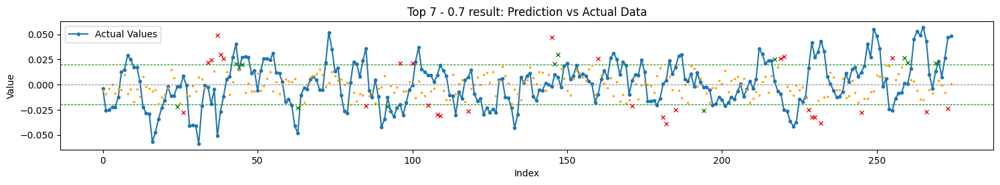

Total TH Pred.: 41
TH Pred. acc. : 29.27


Top 8 - 0.7
RMSE: 0.030987, STD_DEV: 0.021968, STD_PRD: 0.018166, OBJDIFF: 0.010920, RDIFF: 0.009018
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028559, inv. diff> 0.008492
Trend accuracy       : 43.273
Trend up accuracy    : 36.986
Trend down accuracy  : 50.388


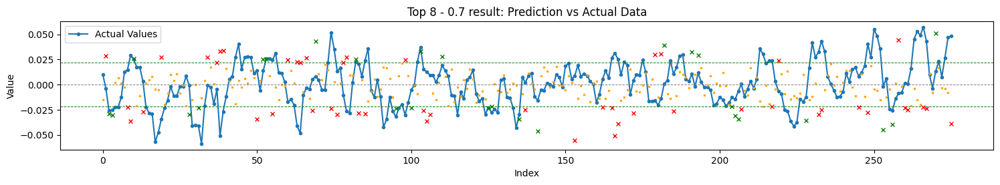

Total TH Pred.: 76
TH Pred. acc. : 35.53


Top 9 - 0.7
RMSE: 0.033816, STD_DEV: 0.022002, STD_PRD: 0.024176, OBJDIFF: 0.012902, RDIFF: 0.011815
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032828, inv. diff> 0.011914
Trend accuracy       : 47.810
Trend up accuracy    : 50.345
Trend down accuracy  : 44.961


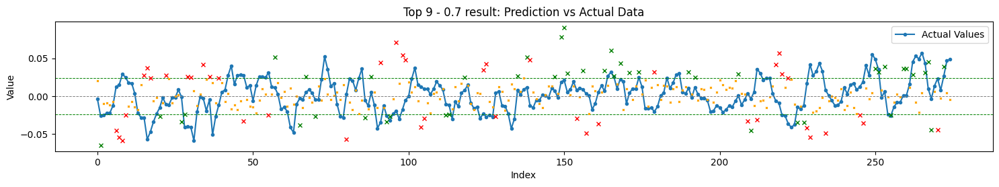

Total TH Pred.: 87
TH Pred. acc. : 51.72


Top 10 - 0.7
RMSE: 0.034754, STD_DEV: 0.021968, STD_PRD: 0.023858, OBJDIFF: 0.013730, RDIFF: 0.012786
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032922, inv. diff> 0.011898
Trend accuracy       : 41.455
Trend up accuracy    : 46.575
Trend down accuracy  : 35.659


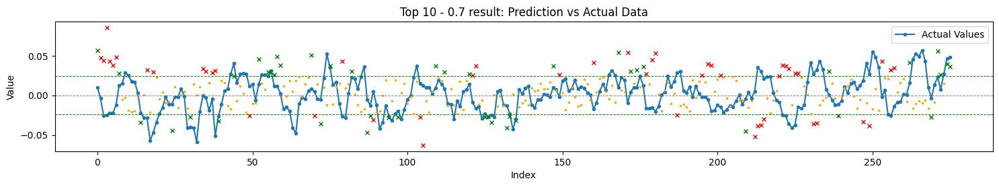

Total TH Pred.: 92
TH Pred. acc. : 47.83


Top 11 - 0.7
RMSE: 0.035847, STD_DEV: 0.021968, STD_PRD: 0.024534, OBJDIFF: 0.015162, RDIFF: 0.013879
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032940, inv. diff> 0.012254
Trend accuracy       : 44.727
Trend up accuracy    : 42.466
Trend down accuracy  : 47.287


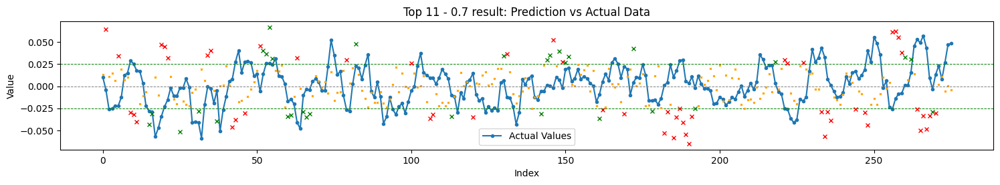

Total TH Pred.: 85
TH Pred. acc. : 36.47


Top 12 - 0.7
RMSE: 0.036490, STD_DEV: 0.021968, STD_PRD: 0.027188, OBJDIFF: 0.017131, RDIFF: 0.014522
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035034, inv. diff> 0.015675
Trend accuracy       : 43.636
Trend up accuracy    : 41.781
Trend down accuracy  : 45.736


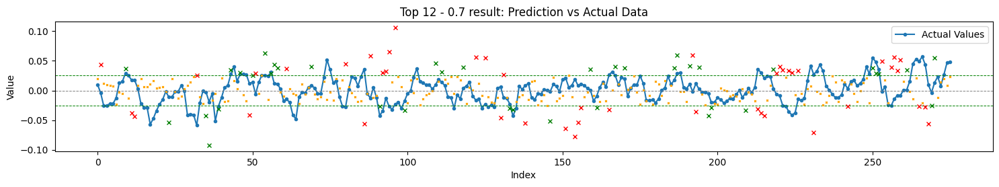

Total TH Pred.: 84
TH Pred. acc. : 46.43


Top 13 - 0.7
RMSE: 0.035285, STD_DEV: 0.022002, STD_PRD: 0.030008, OBJDIFF: 0.017287, RDIFF: 0.013284
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.037241, inv. diff> 0.019243
Trend accuracy       : 54.015
Trend up accuracy    : 48.966
Trend down accuracy  : 59.690


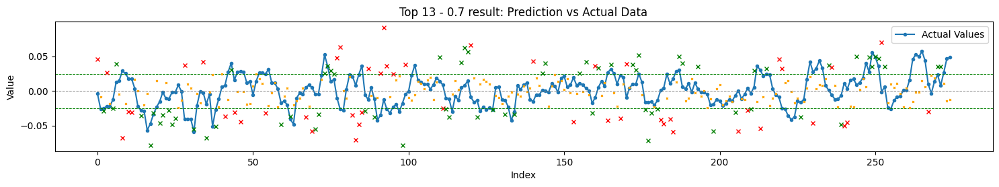

Total TH Pred.: 117
TH Pred. acc. : 58.97


Top 14 - 0.7
RMSE: 0.036799, STD_DEV: 0.022002, STD_PRD: 0.028081, OBJDIFF: 0.017837, RDIFF: 0.014798
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035727, inv. diff> 0.016765
Trend accuracy       : 48.175
Trend up accuracy    : 47.586
Trend down accuracy  : 48.837


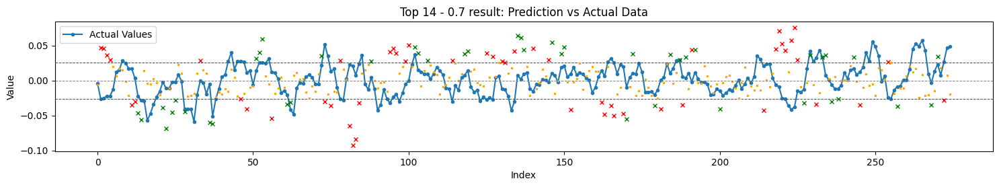

Total TH Pred.: 96
TH Pred. acc. : 46.88


Top 15 - 0.7
RMSE: 0.037216, STD_DEV: 0.021968, STD_PRD: 0.029667, OBJDIFF: 0.019096, RDIFF: 0.015247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.036920, inv. diff> 0.018801
Trend accuracy       : 45.091
Trend up accuracy    : 42.466
Trend down accuracy  : 48.062


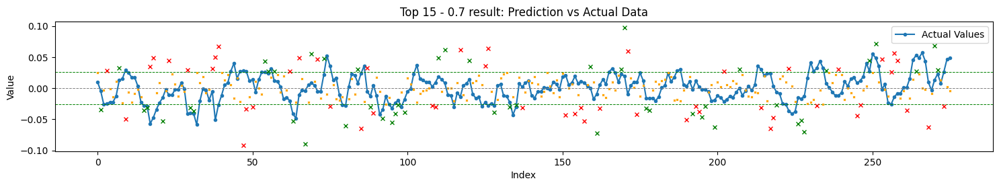

Total TH Pred.: 100
TH Pred. acc. : 49.00


Top 1 - 0.8
RMSE: 0.025128, STD_DEV: 0.021968, STD_PRD: 0.013265, OBJDIFF: 0.007511, RDIFF: 0.003160
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026049, inv. diff> 0.008433
Trend accuracy       : 52.727
Trend up accuracy    : 65.068
Trend down accuracy  : 38.760


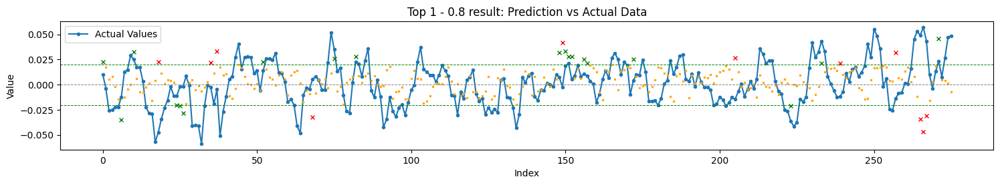

Total TH Pred.: 30
TH Pred. acc. : 63.33


Top 2 - 0.8
RMSE: 0.027260, STD_DEV: 0.021968, STD_PRD: 0.017434, OBJDIFF: 0.007559, RDIFF: 0.005292
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028125, inv. diff> 0.008423
Trend accuracy       : 54.545
Trend up accuracy    : 58.219
Trend down accuracy  : 50.388


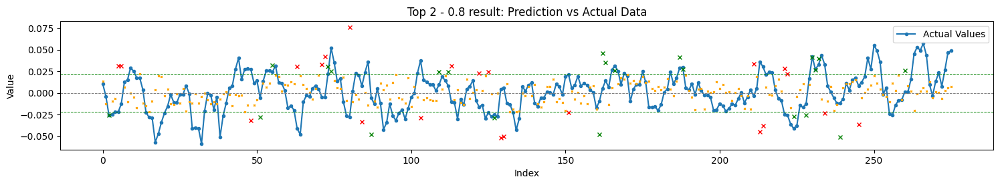

Total TH Pred.: 44
TH Pred. acc. : 50.00


Top 3 - 0.8
RMSE: 0.029646, STD_DEV: 0.022002, STD_PRD: 0.019800, OBJDIFF: 0.008745, RDIFF: 0.007645
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029856, inv. diff> 0.008955
Trend accuracy       : 52.555
Trend up accuracy    : 55.862
Trend down accuracy  : 48.837


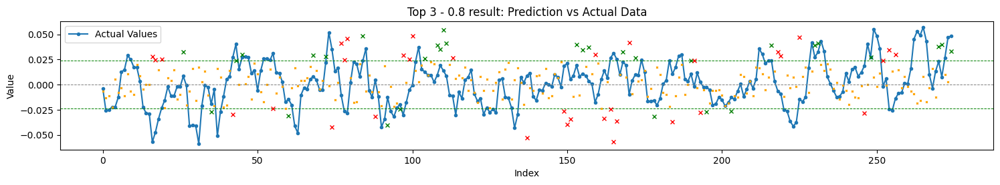

Total TH Pred.: 65
TH Pred. acc. : 47.69


Top 4 - 0.8
RMSE: 0.027890, STD_DEV: 0.022002, STD_PRD: 0.016155, OBJDIFF: 0.008812, RDIFF: 0.005889
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027303, inv. diff> 0.008224
Trend accuracy       : 46.715
Trend up accuracy    : 44.828
Trend down accuracy  : 48.837


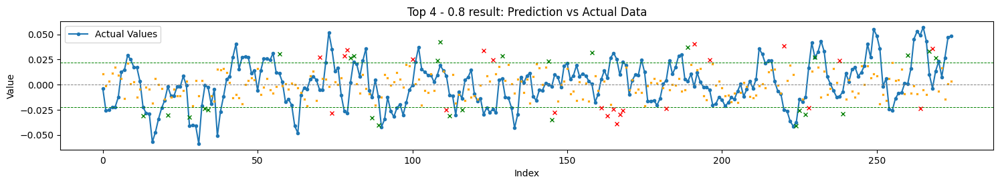

Total TH Pred.: 50
TH Pred. acc. : 54.00


Top 5 - 0.8
RMSE: 0.031104, STD_DEV: 0.022002, STD_PRD: 0.022781, OBJDIFF: 0.009492, RDIFF: 0.009103
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.031811, inv. diff> 0.010199
Trend accuracy       : 50.000
Trend up accuracy    : 54.483
Trend down accuracy  : 44.961


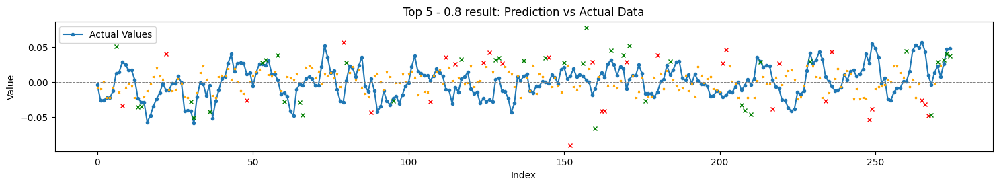

Total TH Pred.: 68
TH Pred. acc. : 57.35


Top 6 - 0.8
RMSE: 0.028839, STD_DEV: 0.022002, STD_PRD: 0.015904, OBJDIFF: 0.009886, RDIFF: 0.006837
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027215, inv. diff> 0.008263
Trend accuracy       : 52.190
Trend up accuracy    : 67.586
Trend down accuracy  : 34.884


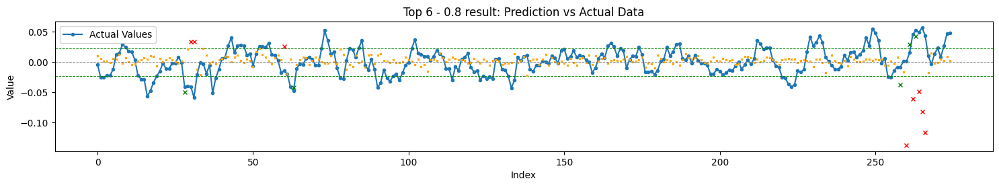

Total TH Pred.: 13
TH Pred. acc. : 38.46


Top 7 - 0.8
RMSE: 0.028256, STD_DEV: 0.022002, STD_PRD: 0.013949, OBJDIFF: 0.010281, RDIFF: 0.006255
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026051, inv. diff> 0.008075
Trend accuracy       : 44.891
Trend up accuracy    : 41.379
Trend down accuracy  : 48.837


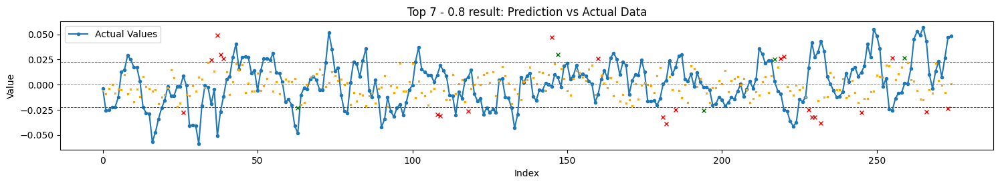

Total TH Pred.: 28
TH Pred. acc. : 17.86


Top 8 - 0.8
RMSE: 0.030987, STD_DEV: 0.021968, STD_PRD: 0.018166, OBJDIFF: 0.010920, RDIFF: 0.009018
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028559, inv. diff> 0.008492
Trend accuracy       : 43.273
Trend up accuracy    : 36.986
Trend down accuracy  : 50.388


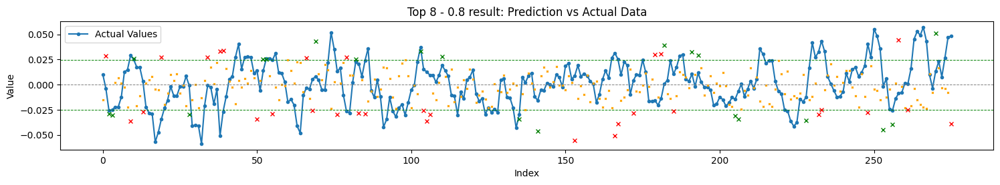

Total TH Pred.: 52
TH Pred. acc. : 40.38


Top 9 - 0.8
RMSE: 0.033816, STD_DEV: 0.022002, STD_PRD: 0.024176, OBJDIFF: 0.012902, RDIFF: 0.011815
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032828, inv. diff> 0.011914
Trend accuracy       : 47.810
Trend up accuracy    : 50.345
Trend down accuracy  : 44.961


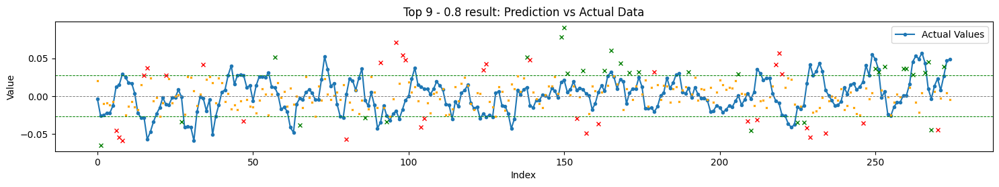

Total TH Pred.: 63
TH Pred. acc. : 49.21


Top 10 - 0.8
RMSE: 0.034754, STD_DEV: 0.021968, STD_PRD: 0.023858, OBJDIFF: 0.013730, RDIFF: 0.012786
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032922, inv. diff> 0.011898
Trend accuracy       : 41.455
Trend up accuracy    : 46.575
Trend down accuracy  : 35.659


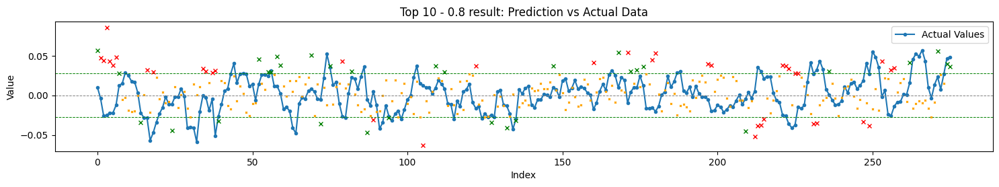

Total TH Pred.: 70
TH Pred. acc. : 45.71


Top 11 - 0.8
RMSE: 0.035847, STD_DEV: 0.021968, STD_PRD: 0.024534, OBJDIFF: 0.015162, RDIFF: 0.013879
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032940, inv. diff> 0.012254
Trend accuracy       : 44.727
Trend up accuracy    : 42.466
Trend down accuracy  : 47.287


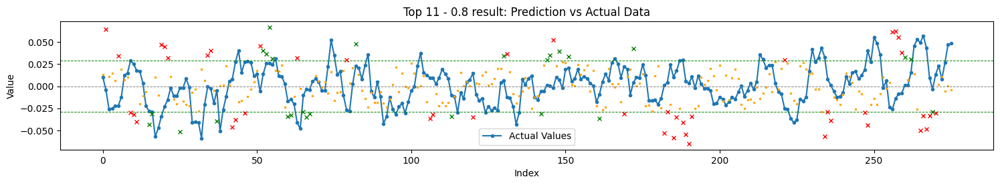

Total TH Pred.: 71
TH Pred. acc. : 36.62


Top 12 - 0.8
RMSE: 0.036490, STD_DEV: 0.021968, STD_PRD: 0.027188, OBJDIFF: 0.017131, RDIFF: 0.014522
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035034, inv. diff> 0.015675
Trend accuracy       : 43.636
Trend up accuracy    : 41.781
Trend down accuracy  : 45.736


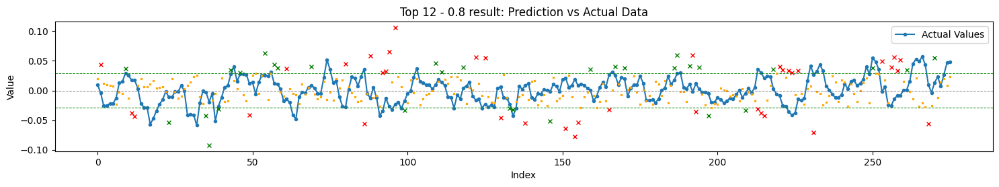

Total TH Pred.: 68
TH Pred. acc. : 45.59


Top 13 - 0.8
RMSE: 0.035285, STD_DEV: 0.022002, STD_PRD: 0.030008, OBJDIFF: 0.017287, RDIFF: 0.013284
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.037241, inv. diff> 0.019243
Trend accuracy       : 54.015
Trend up accuracy    : 48.966
Trend down accuracy  : 59.690


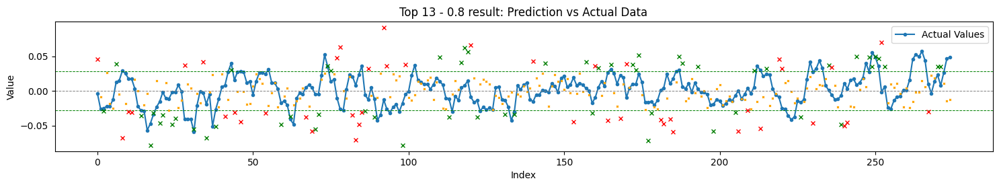

Total TH Pred.: 102
TH Pred. acc. : 56.86


Top 14 - 0.8
RMSE: 0.036799, STD_DEV: 0.022002, STD_PRD: 0.028081, OBJDIFF: 0.017837, RDIFF: 0.014798
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035727, inv. diff> 0.016765
Trend accuracy       : 48.175
Trend up accuracy    : 47.586
Trend down accuracy  : 48.837


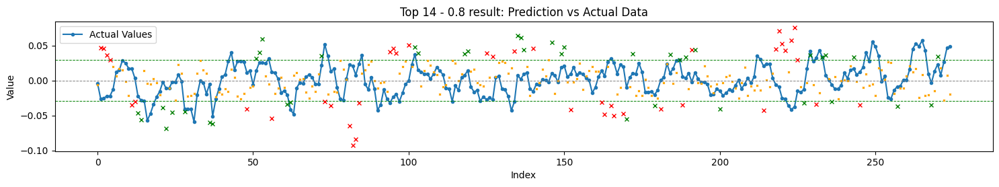

Total TH Pred.: 82
TH Pred. acc. : 50.00


Top 15 - 0.8
RMSE: 0.037216, STD_DEV: 0.021968, STD_PRD: 0.029667, OBJDIFF: 0.019096, RDIFF: 0.015247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.036920, inv. diff> 0.018801
Trend accuracy       : 45.091
Trend up accuracy    : 42.466
Trend down accuracy  : 48.062


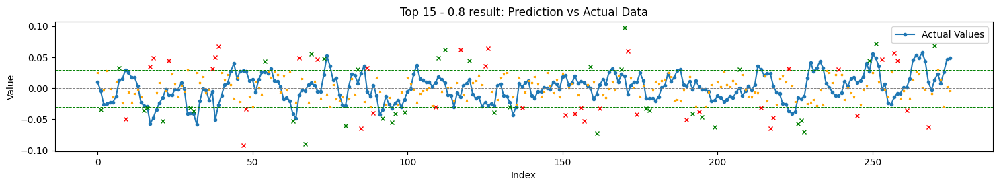

Total TH Pred.: 78
TH Pred. acc. : 50.00


Top 1 - 0.9
RMSE: 0.025128, STD_DEV: 0.021968, STD_PRD: 0.013265, OBJDIFF: 0.007511, RDIFF: 0.003160
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026049, inv. diff> 0.008433
Trend accuracy       : 52.727
Trend up accuracy    : 65.068
Trend down accuracy  : 38.760


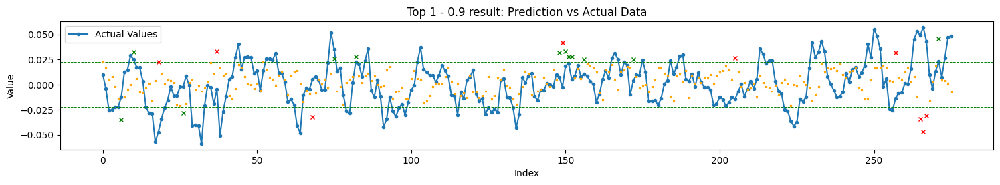

Total TH Pred.: 21
TH Pred. acc. : 57.14


Top 2 - 0.9
RMSE: 0.027260, STD_DEV: 0.021968, STD_PRD: 0.017434, OBJDIFF: 0.007559, RDIFF: 0.005292
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028125, inv. diff> 0.008423
Trend accuracy       : 54.545
Trend up accuracy    : 58.219
Trend down accuracy  : 50.388


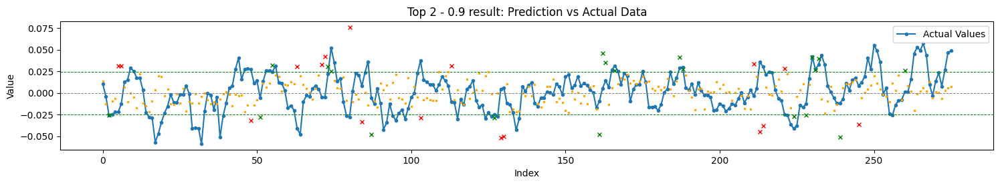

Total TH Pred.: 37
TH Pred. acc. : 54.05


Top 3 - 0.9
RMSE: 0.029646, STD_DEV: 0.022002, STD_PRD: 0.019800, OBJDIFF: 0.008745, RDIFF: 0.007645
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029856, inv. diff> 0.008955
Trend accuracy       : 52.555
Trend up accuracy    : 55.862
Trend down accuracy  : 48.837


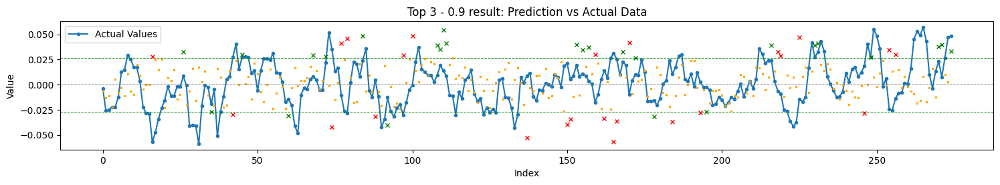

Total TH Pred.: 50
TH Pred. acc. : 52.00


Top 4 - 0.9
RMSE: 0.027890, STD_DEV: 0.022002, STD_PRD: 0.016155, OBJDIFF: 0.008812, RDIFF: 0.005889
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027303, inv. diff> 0.008224
Trend accuracy       : 46.715
Trend up accuracy    : 44.828
Trend down accuracy  : 48.837


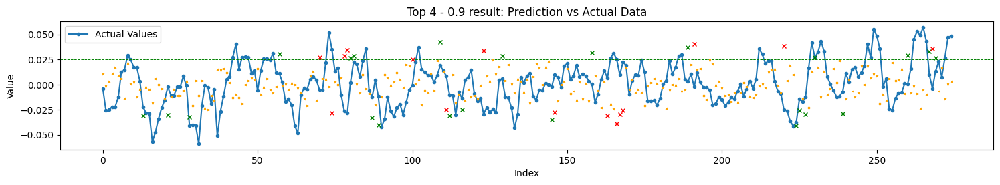

Total TH Pred.: 38
TH Pred. acc. : 60.53


Top 5 - 0.9
RMSE: 0.031104, STD_DEV: 0.022002, STD_PRD: 0.022781, OBJDIFF: 0.009492, RDIFF: 0.009103
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.031811, inv. diff> 0.010199
Trend accuracy       : 50.000
Trend up accuracy    : 54.483
Trend down accuracy  : 44.961


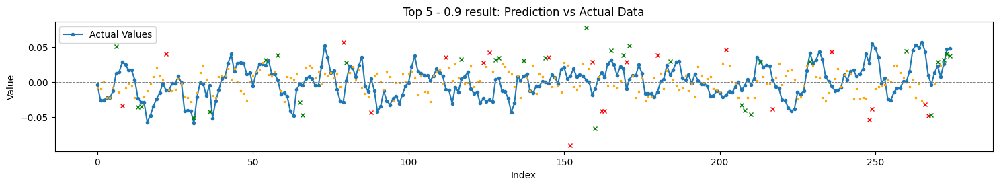

Total TH Pred.: 53
TH Pred. acc. : 60.38


Top 6 - 0.9
RMSE: 0.028839, STD_DEV: 0.022002, STD_PRD: 0.015904, OBJDIFF: 0.009886, RDIFF: 0.006837
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027215, inv. diff> 0.008263
Trend accuracy       : 52.190
Trend up accuracy    : 67.586
Trend down accuracy  : 34.884


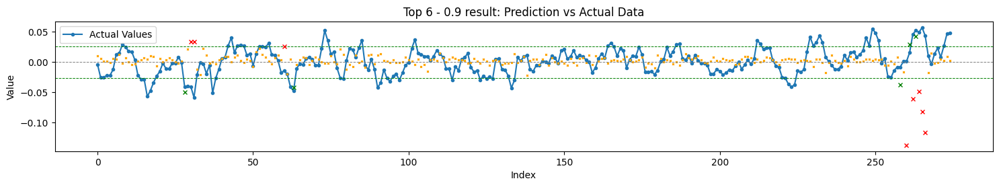

Total TH Pred.: 13
TH Pred. acc. : 38.46


Top 7 - 0.9
RMSE: 0.028256, STD_DEV: 0.022002, STD_PRD: 0.013949, OBJDIFF: 0.010281, RDIFF: 0.006255
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026051, inv. diff> 0.008075
Trend accuracy       : 44.891
Trend up accuracy    : 41.379
Trend down accuracy  : 48.837


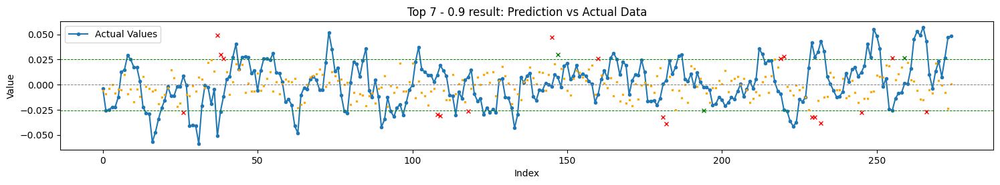

Total TH Pred.: 22
TH Pred. acc. : 13.64


Top 8 - 0.9
RMSE: 0.030987, STD_DEV: 0.021968, STD_PRD: 0.018166, OBJDIFF: 0.010920, RDIFF: 0.009018
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028559, inv. diff> 0.008492
Trend accuracy       : 43.273
Trend up accuracy    : 36.986
Trend down accuracy  : 50.388


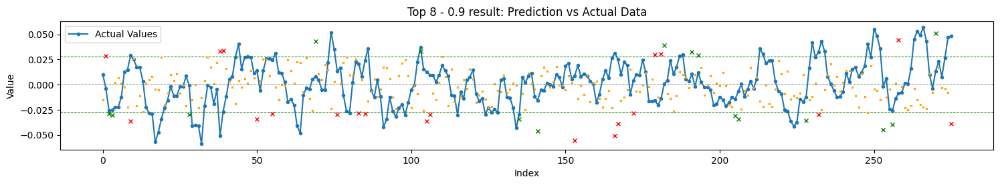

Total TH Pred.: 36
TH Pred. acc. : 44.44


Top 9 - 0.9
RMSE: 0.033816, STD_DEV: 0.022002, STD_PRD: 0.024176, OBJDIFF: 0.012902, RDIFF: 0.011815
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032828, inv. diff> 0.011914
Trend accuracy       : 47.810
Trend up accuracy    : 50.345
Trend down accuracy  : 44.961


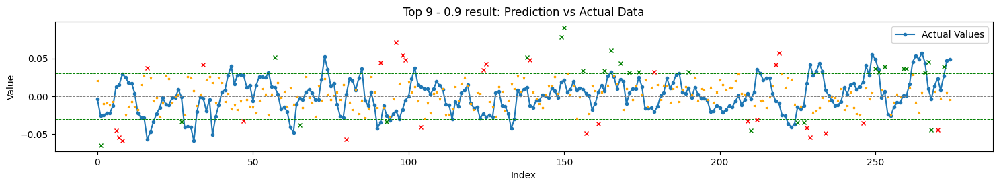

Total TH Pred.: 54
TH Pred. acc. : 50.00


Top 10 - 0.9
RMSE: 0.034754, STD_DEV: 0.021968, STD_PRD: 0.023858, OBJDIFF: 0.013730, RDIFF: 0.012786
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032922, inv. diff> 0.011898
Trend accuracy       : 41.455
Trend up accuracy    : 46.575
Trend down accuracy  : 35.659


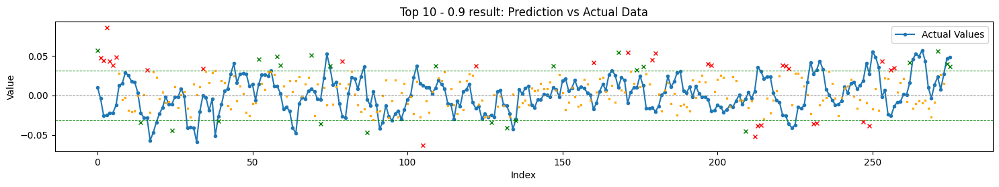

Total TH Pred.: 54
TH Pred. acc. : 44.44


Top 11 - 0.9
RMSE: 0.035847, STD_DEV: 0.021968, STD_PRD: 0.024534, OBJDIFF: 0.015162, RDIFF: 0.013879
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032940, inv. diff> 0.012254
Trend accuracy       : 44.727
Trend up accuracy    : 42.466
Trend down accuracy  : 47.287


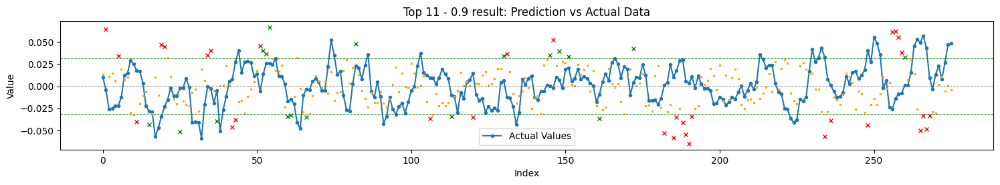

Total TH Pred.: 50
TH Pred. acc. : 36.00


Top 12 - 0.9
RMSE: 0.036490, STD_DEV: 0.021968, STD_PRD: 0.027188, OBJDIFF: 0.017131, RDIFF: 0.014522
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035034, inv. diff> 0.015675
Trend accuracy       : 43.636
Trend up accuracy    : 41.781
Trend down accuracy  : 45.736


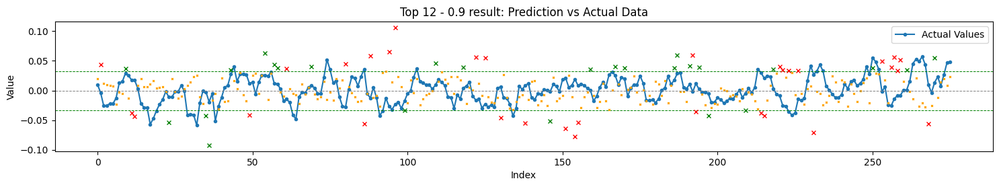

Total TH Pred.: 58
TH Pred. acc. : 44.83


Top 13 - 0.9
RMSE: 0.035285, STD_DEV: 0.022002, STD_PRD: 0.030008, OBJDIFF: 0.017287, RDIFF: 0.013284
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.037241, inv. diff> 0.019243
Trend accuracy       : 54.015
Trend up accuracy    : 48.966
Trend down accuracy  : 59.690


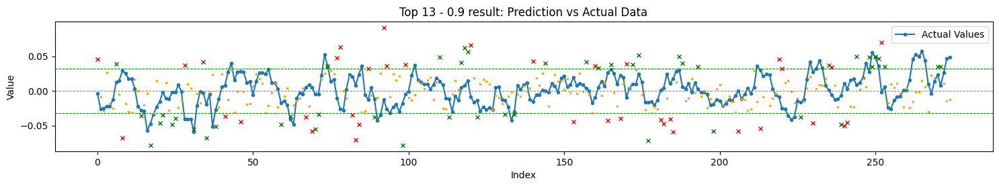

Total TH Pred.: 84
TH Pred. acc. : 55.95


Top 14 - 0.9
RMSE: 0.036799, STD_DEV: 0.022002, STD_PRD: 0.028081, OBJDIFF: 0.017837, RDIFF: 0.014798
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035727, inv. diff> 0.016765
Trend accuracy       : 48.175
Trend up accuracy    : 47.586
Trend down accuracy  : 48.837


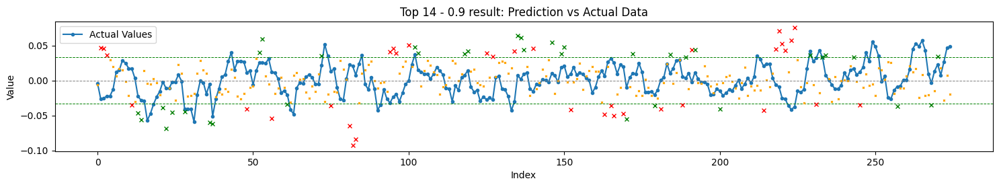

Total TH Pred.: 71
TH Pred. acc. : 50.70


Top 15 - 0.9
RMSE: 0.037216, STD_DEV: 0.021968, STD_PRD: 0.029667, OBJDIFF: 0.019096, RDIFF: 0.015247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.036920, inv. diff> 0.018801
Trend accuracy       : 45.091
Trend up accuracy    : 42.466
Trend down accuracy  : 48.062


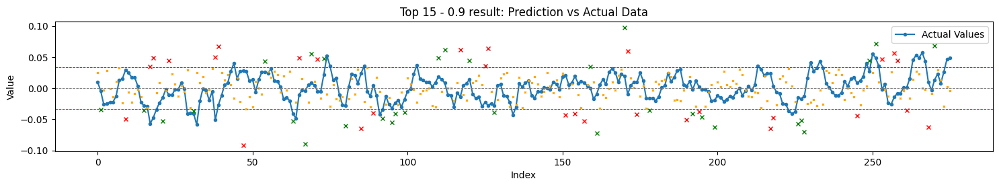

Total TH Pred.: 60
TH Pred. acc. : 51.67


Top 1 - 1.0
RMSE: 0.025128, STD_DEV: 0.021968, STD_PRD: 0.013265, OBJDIFF: 0.007511, RDIFF: 0.003160
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026049, inv. diff> 0.008433
Trend accuracy       : 52.727
Trend up accuracy    : 65.068
Trend down accuracy  : 38.760


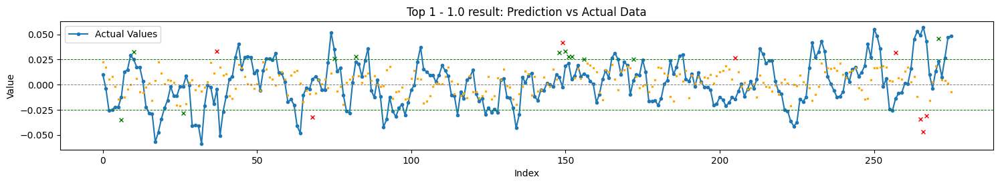

Total TH Pred.: 20
TH Pred. acc. : 60.00


Top 2 - 1.0
RMSE: 0.027260, STD_DEV: 0.021968, STD_PRD: 0.017434, OBJDIFF: 0.007559, RDIFF: 0.005292
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028125, inv. diff> 0.008423
Trend accuracy       : 54.545
Trend up accuracy    : 58.219
Trend down accuracy  : 50.388


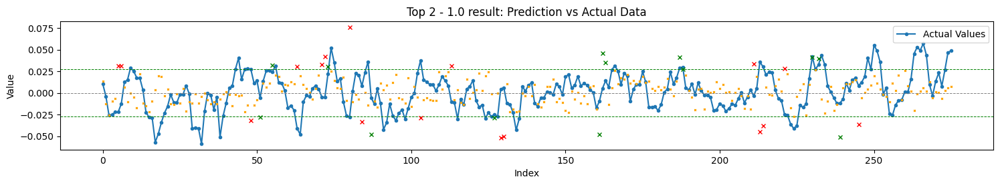

Total TH Pred.: 30
TH Pred. acc. : 43.33


Top 3 - 1.0
RMSE: 0.029646, STD_DEV: 0.022002, STD_PRD: 0.019800, OBJDIFF: 0.008745, RDIFF: 0.007645
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.029856, inv. diff> 0.008955
Trend accuracy       : 52.555
Trend up accuracy    : 55.862
Trend down accuracy  : 48.837


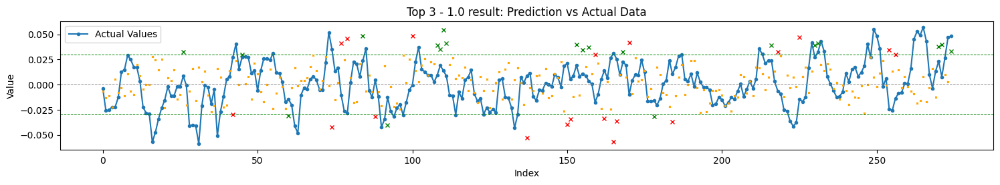

Total TH Pred.: 39
TH Pred. acc. : 51.28


Top 4 - 1.0
RMSE: 0.027890, STD_DEV: 0.022002, STD_PRD: 0.016155, OBJDIFF: 0.008812, RDIFF: 0.005889
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027303, inv. diff> 0.008224
Trend accuracy       : 46.715
Trend up accuracy    : 44.828
Trend down accuracy  : 48.837


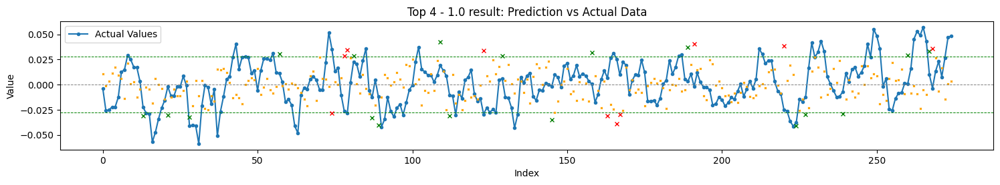

Total TH Pred.: 28
TH Pred. acc. : 64.29


Top 5 - 1.0
RMSE: 0.031104, STD_DEV: 0.022002, STD_PRD: 0.022781, OBJDIFF: 0.009492, RDIFF: 0.009103
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.031811, inv. diff> 0.010199
Trend accuracy       : 50.000
Trend up accuracy    : 54.483
Trend down accuracy  : 44.961


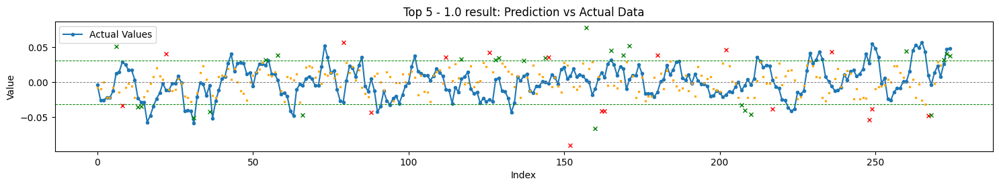

Total TH Pred.: 43
TH Pred. acc. : 60.47


Top 6 - 1.0
RMSE: 0.028839, STD_DEV: 0.022002, STD_PRD: 0.015904, OBJDIFF: 0.009886, RDIFF: 0.006837
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.027215, inv. diff> 0.008263
Trend accuracy       : 52.190
Trend up accuracy    : 67.586
Trend down accuracy  : 34.884


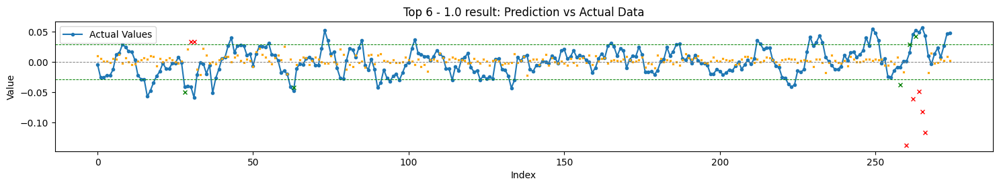

Total TH Pred.: 12
TH Pred. acc. : 41.67


Top 7 - 1.0
RMSE: 0.028256, STD_DEV: 0.022002, STD_PRD: 0.013949, OBJDIFF: 0.010281, RDIFF: 0.006255
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.026051, inv. diff> 0.008075
Trend accuracy       : 44.891
Trend up accuracy    : 41.379
Trend down accuracy  : 48.837


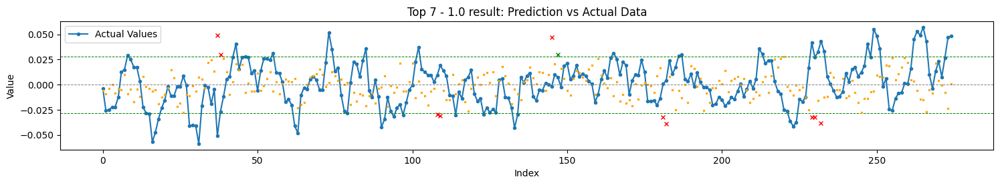

Total TH Pred.: 11
TH Pred. acc. : 9.09


Top 8 - 1.0
RMSE: 0.030987, STD_DEV: 0.021968, STD_PRD: 0.018166, OBJDIFF: 0.010920, RDIFF: 0.009018
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.028559, inv. diff> 0.008492
Trend accuracy       : 43.273
Trend up accuracy    : 36.986
Trend down accuracy  : 50.388


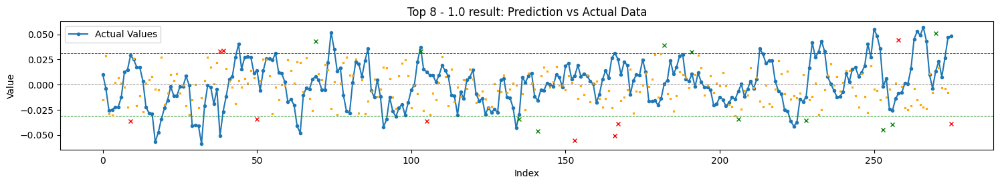

Total TH Pred.: 21
TH Pred. acc. : 52.38


Top 9 - 1.0
RMSE: 0.033816, STD_DEV: 0.022002, STD_PRD: 0.024176, OBJDIFF: 0.012902, RDIFF: 0.011815
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032828, inv. diff> 0.011914
Trend accuracy       : 47.810
Trend up accuracy    : 50.345
Trend down accuracy  : 44.961


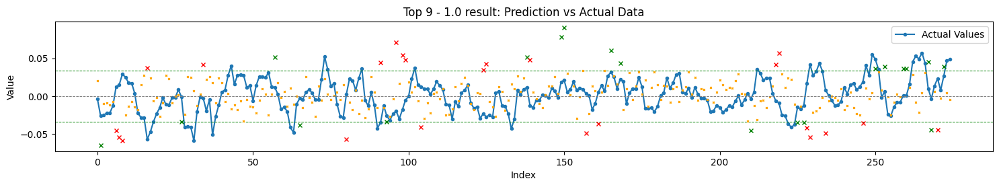

Total TH Pred.: 43
TH Pred. acc. : 46.51


Top 10 - 1.0
RMSE: 0.034754, STD_DEV: 0.021968, STD_PRD: 0.023858, OBJDIFF: 0.013730, RDIFF: 0.012786
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 25, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032922, inv. diff> 0.011898
Trend accuracy       : 41.455
Trend up accuracy    : 46.575
Trend down accuracy  : 35.659


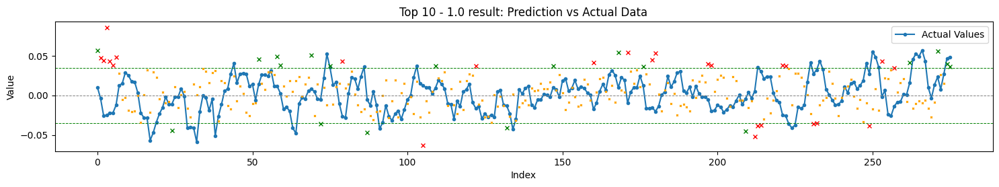

Total TH Pred.: 44
TH Pred. acc. : 43.18


Top 11 - 1.0
RMSE: 0.035847, STD_DEV: 0.021968, STD_PRD: 0.024534, OBJDIFF: 0.015162, RDIFF: 0.013879
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.032940, inv. diff> 0.012254
Trend accuracy       : 44.727
Trend up accuracy    : 42.466
Trend down accuracy  : 47.287


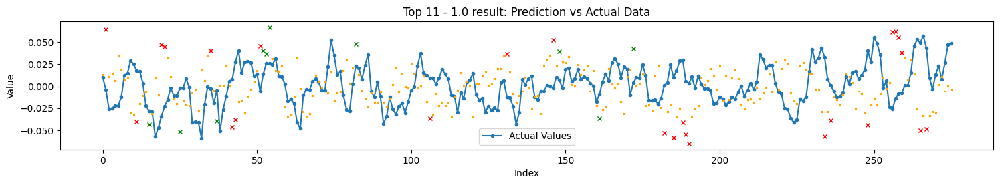

Total TH Pred.: 35
TH Pred. acc. : 28.57


Top 12 - 1.0
RMSE: 0.036490, STD_DEV: 0.021968, STD_PRD: 0.027188, OBJDIFF: 0.017131, RDIFF: 0.014522
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035034, inv. diff> 0.015675
Trend accuracy       : 43.636
Trend up accuracy    : 41.781
Trend down accuracy  : 45.736


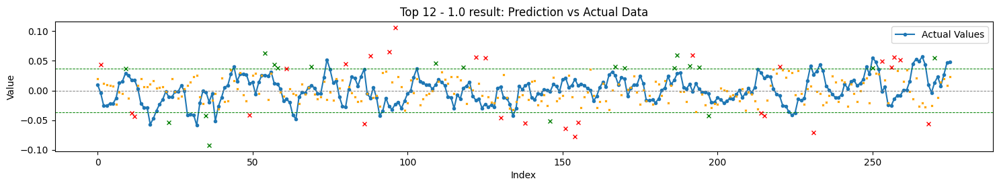

Total TH Pred.: 47
TH Pred. acc. : 42.55


Top 13 - 1.0
RMSE: 0.035285, STD_DEV: 0.022002, STD_PRD: 0.030008, OBJDIFF: 0.017287, RDIFF: 0.013284
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.037241, inv. diff> 0.019243
Trend accuracy       : 54.015
Trend up accuracy    : 48.966
Trend down accuracy  : 59.690


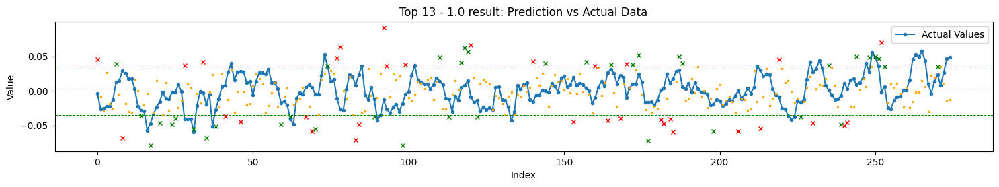

Total TH Pred.: 72
TH Pred. acc. : 54.17


Top 14 - 1.0
RMSE: 0.036799, STD_DEV: 0.022002, STD_PRD: 0.028081, OBJDIFF: 0.017837, RDIFF: 0.014798
n_steps: 60, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 100, 'lstm_units2': 75, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.035727, inv. diff> 0.016765
Trend accuracy       : 48.175
Trend up accuracy    : 47.586
Trend down accuracy  : 48.837


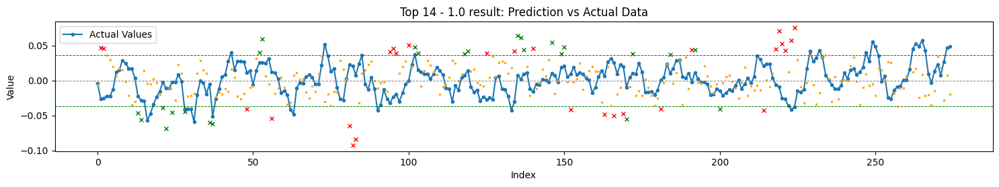

Total TH Pred.: 52
TH Pred. acc. : 48.08


Top 15 - 1.0
RMSE: 0.037216, STD_DEV: 0.021968, STD_PRD: 0.029667, OBJDIFF: 0.019096, RDIFF: 0.015247
n_steps: 40, batch_size: 256, epochs: 200
Model params:  {'lstm_units1': 75, 'lstm_units2': 100, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x70ae4be30970>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.036920, inv. diff> 0.018801
Trend accuracy       : 45.091
Trend up accuracy    : 42.466
Trend down accuracy  : 48.062


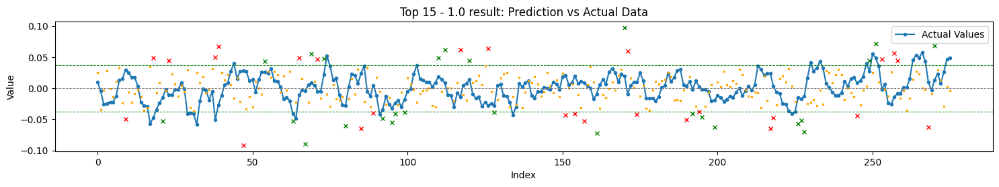

Total TH Pred.: 52
TH Pred. acc. : 50.00




In [65]:
for mult in [.5,.6,.7,.8,.9,1.0]:
    for i,result in enumerate(top_results_sort,1):

        # if result['rmse']-result['std_dev'] >= 0:
        #     continue

        print(f"Top {i} - {mult}")

        # if (result['rmse']<result['std_dev']):
        #     result['diff'] = result['rmse']-result['std_dev'] + abs(np.std(result['predictions']) - result['std_dev'])/4.0
        # else:
        #     result['diff'] = (result['rmse']- result['std_dev']) + abs(np.std(result['predictions']) - result['std_dev'])/2.0

        print("RMSE: {:.6f}, STD_DEV: {:.6f}, STD_PRD: {:.6f}, OBJDIFF: {:.6f}, RDIFF: {:.6f}".format(result['rmse'], result['std_dev'], np.std(result['predictions']), result['diff'],result['rmse']-result['std_dev']))
        print("n_steps: {}, batch_size: {}, epochs: {}".format(result['n_steps'], result['batch_size'], result['epochs']))
        # print("batch_size: {}, epochs: {}".format(result['batch_size'], result['epochs']))
        print("Model params: ", result['md_prm'])
        print("Feature list: ", result['feature_list'])

        # var_tot     = set(variable_options)
        # fea_list    = set(result['feature_list'])
        # print("Discarded var: {}".format(var_tot - fea_list))

        result['inv_rmse'] = inv_rmse = rmse(result['true_values'], result['predictions']*-1)
        inv_diff = (inv_rmse - result['std_dev']) + abs(np.std(result['predictions']) - result['std_dev'])/2.0
        print("Inv. rmse> {:.6f}, inv. diff> {:.6f}".format(inv_rmse, inv_diff))

        # calculate trend prediction percentage

        trend_up_true   = 0
        trend_down_true = 0
        trend_up_pred   = 0
        trend_down_pred = 0

        for j in range(len(result['true_values'])-1):
            if result['true_values'][j] > 0.0:
                trend_up_pred += 1
                if result['predictions'][j] > 0.0:
                    trend_up_true += 1
            if result['true_values'][j] < 0.0:
                trend_down_pred += 1
                if result['predictions'][j] < 0.0:
                    trend_down_true += 1

        trend_true      = trend_up_true + trend_down_true
        trend_pred      = trend_up_pred + trend_down_pred
        trend_accuracy  = trend_true/trend_pred
        print("Trend accuracy       : {:.3f}".format(trend_accuracy*100))
        print("Trend up accuracy    : {:.3f}".format(trend_up_true*100/trend_up_pred))
        print("Trend down accuracy  : {:.3f}".format(trend_down_true*100/trend_down_pred))


        tot_pred, prof, loss = plot_predictions(result['true_values'], result['predictions'],-1, title=f"Top {i} - {mult} result: Prediction vs Actual Data",rmse=result['rmse']*mult)
        print("Total TH Pred.: {}".format(tot_pred))
        if tot_pred != 0:
            print("TH Pred. acc. : {:.2f}".format(prof*100.0/tot_pred))
        print('\n')


In [66]:
# export the best result predictions and true values to a csv file
res = 1
best_result = top_results[res]
best_result_df = pd.DataFrame({'True Values': best_result['true_values'], 'Predictions': best_result['predictions'].flatten()})
best_result_df.to_csv('../output/lstm_best_result_{}.csv'.format(res), index=False)